This pipeline opens the result of ICAalamelodic.m, lets the user interactively label the components that look like neuronal activity (rather than movement artefacts or noise), sort them by label, plots a final summary for the chosen components, and save the reordered maps and time series.

In [1]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
%matplotlib inline 
import pylab

Open time series

In [2]:
import scipy.io as sio
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from tkinter import Tk
import tkinter.filedialog
#from tkFileDialog import askopenfilename

In [ ]:


Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = tkinter.filedialog.askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

In [4]:
Ua=sio.loadmat('Z:/GrunwaldKadow_group/Sophie/Ariane_project/WholeBrainPutrescine/Data377regc148Smith20_4_67TS.mat')

In [6]:
DT=Ua['TSo']

In [7]:
DT.shape

(4998, 148)

In [8]:
S1=DT.shape

In [9]:
DTmean=np.zeros(S1)
DTvar=np.zeros(S1)
Var=np.zeros(S1[1])

In [10]:
for i in range(S1[1]):
    DTmean[:,i]=DT[:,i]-np.mean(DT[:,i],0)

In [11]:
for i in range(S1[1]):
    Var[i]=np.sqrt(np.var(DTmean[:,i]))
    DTvar[:,i]=DTmean[:,i]/Var[i]

In [12]:
DTvar.shape

(4998, 148)

open maps

In [15]:
import nibabel as nb

In [16]:
img1 = nb.load('Z:/GrunwaldKadow_group/Sophie/Ariane_project/WholeBrainPutrescine/Data377regc148Smith20_4_67IC.nii')

In [17]:
data = img1.get_data()

C:\Users\aimon\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  """Entry point for launching an IPython kernel.


In [18]:
S=data.shape

In [19]:
S

(128, 100, 28, 148)

# Zscore maps

In [20]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

Transform the maps to have zero mean

In [21]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

Transform the maps to have unit variance and zscore

In [22]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2.5
Dmaps[Dmaps<0]=0

Order ICs by variance

In [23]:
datao=data
Dmapso=Dmaps

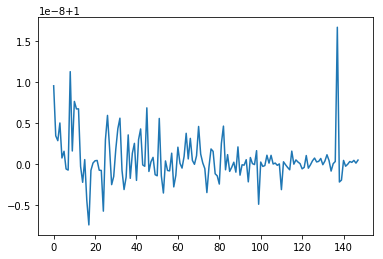

In [ ]:
plt.plot(Var)

#Separate maps in substacks, sort the independent components by brain regions 

In [ ]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (13, 2.5)

In [ ]:
Dtemp=np.max(Dmaps[:,:,:,:],3)

In [ ]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

<IPython.core.display.Javascript object>

In [ ]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100).astype(int)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=Dtemp[:,:,range(Nstack)]
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        #Dmean[:,:,i]=np.max(Vmean,0)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

In [ ]:
DTvar.shape

(4998, 148)

0


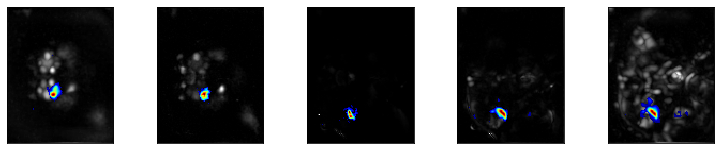

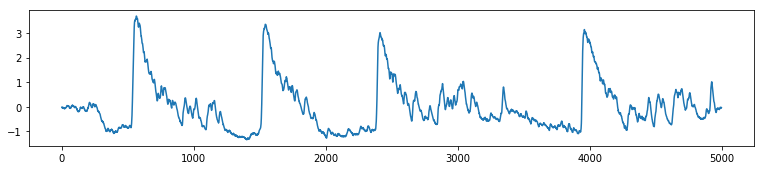

o
1


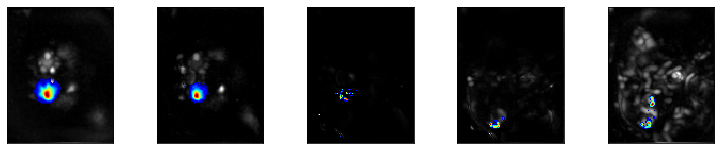

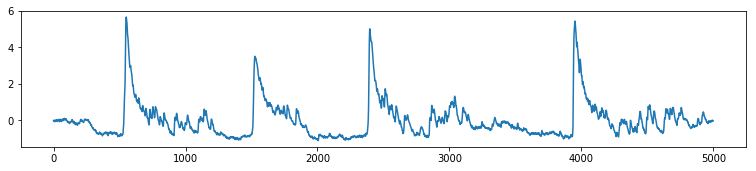

o
2


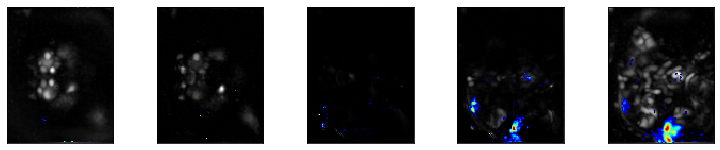

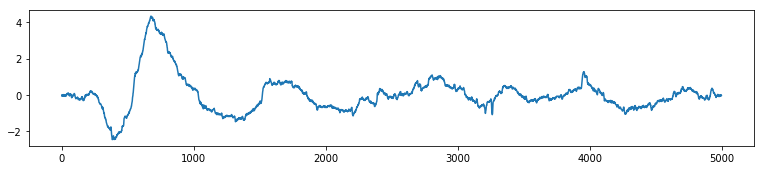


3


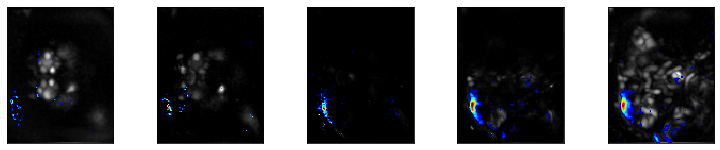

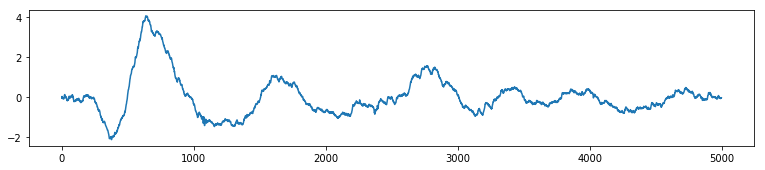


4


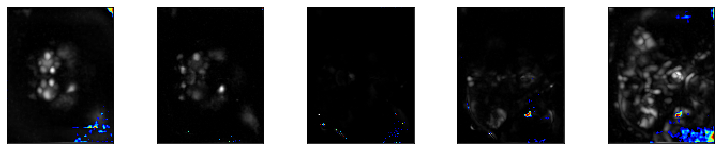

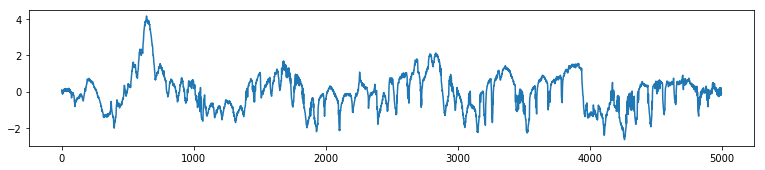


5


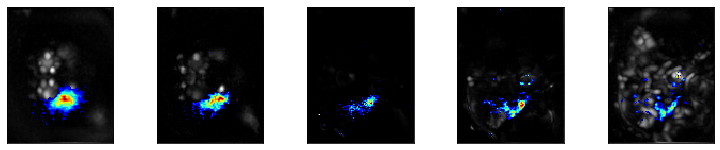

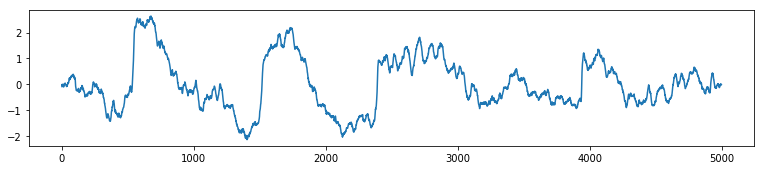

l
6


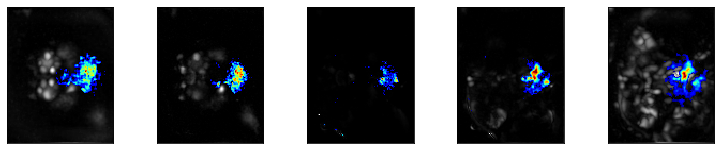

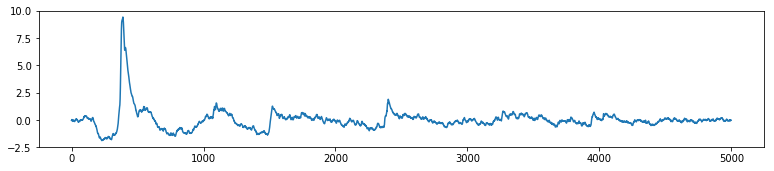

s
7


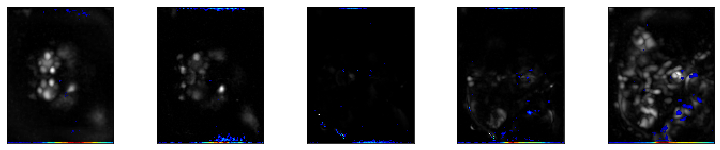

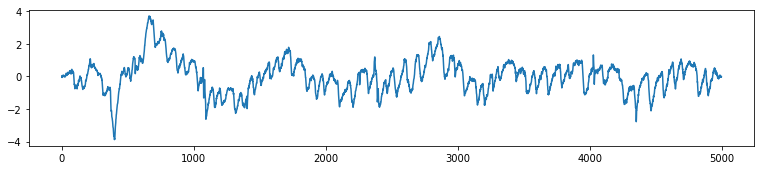


8


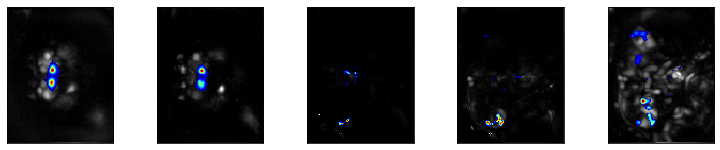

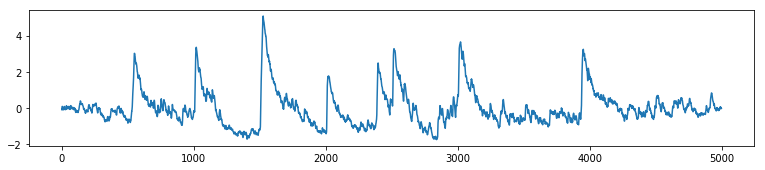

odor
9


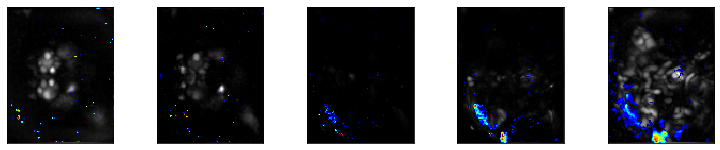

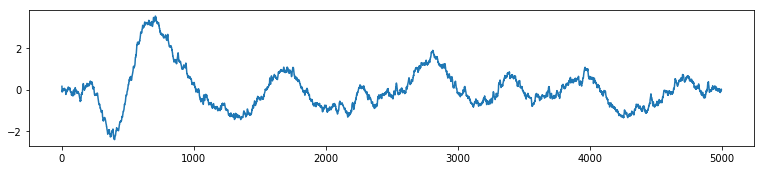


10


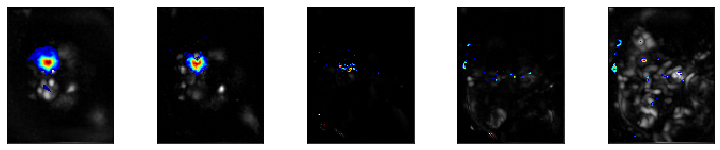

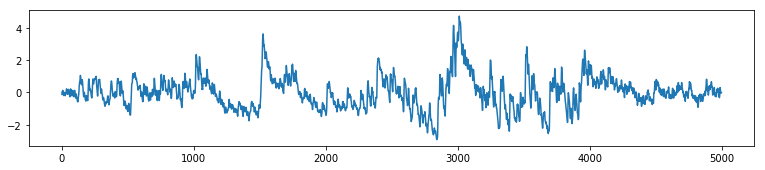

a
11


C:\Users\aimon\Anaconda3\lib\site-packages\matplotlib\image.py:395: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\aimon\Anaconda3\lib\site-packages\matplotlib\image.py:396: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\aimon\Anaconda3\lib\site-packages\matplotlib\image.py:403: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\aimon\Anaconda3\lib\site-packages\matplotlib\image.py:408: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\aimon\Anaconda3\lib\site-packages\matplotlib\colors.py:918: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\aimon\Anaconda3\lib\site-packages\numpy\ma\core.py:718: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


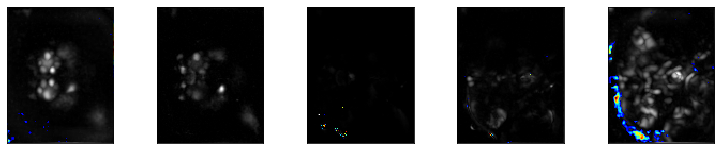

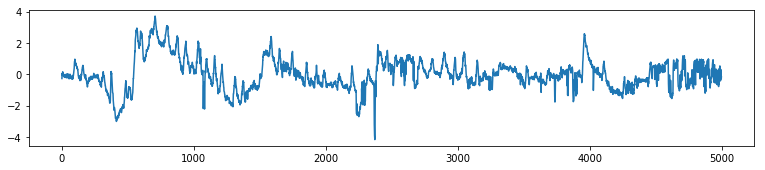


12


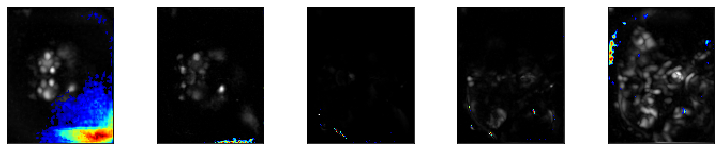

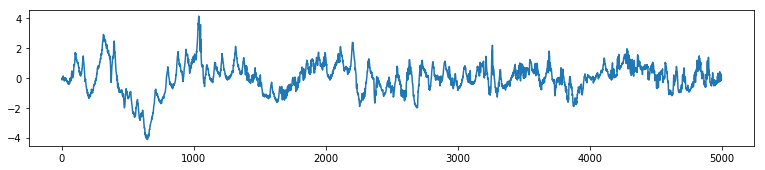


13


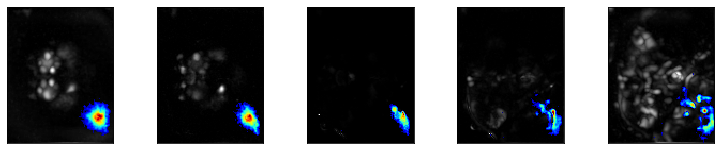

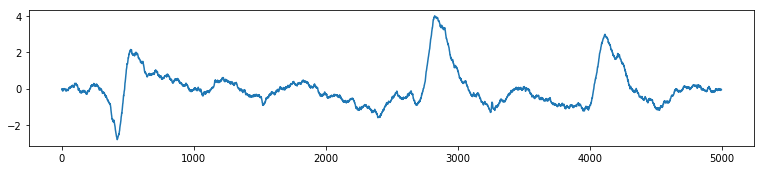


14


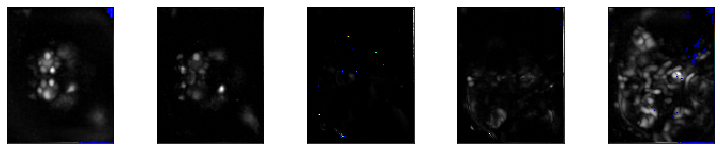

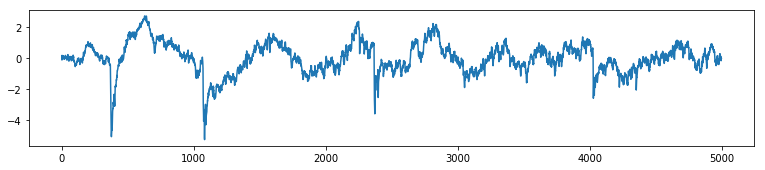


15


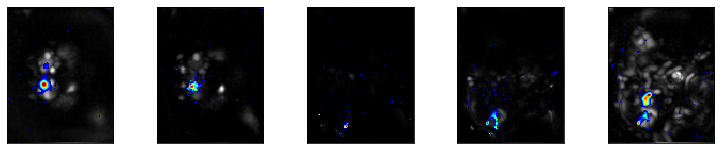

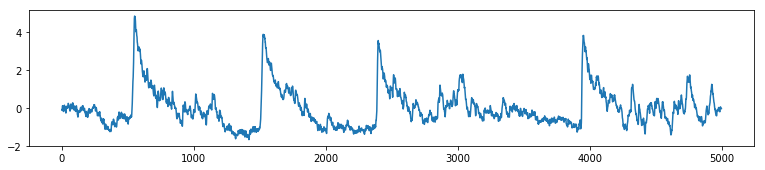

a
16


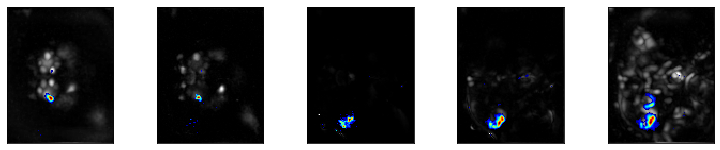

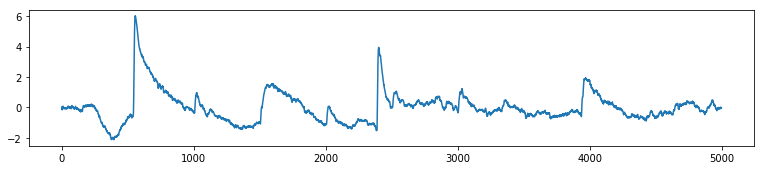

a
17


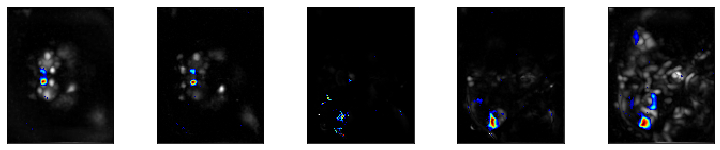

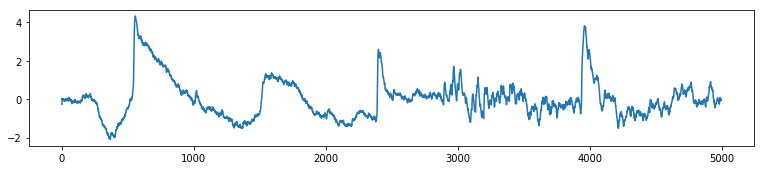

a
18


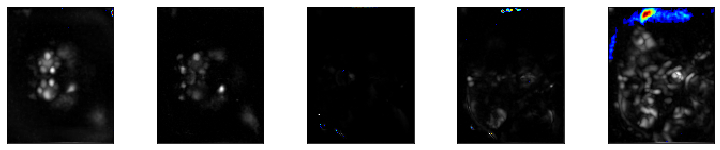

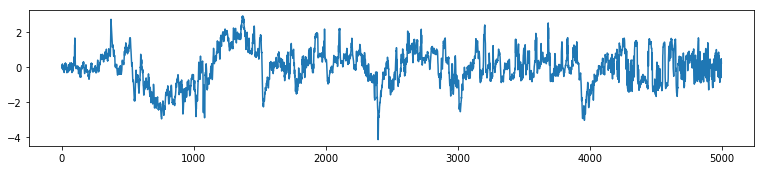


19


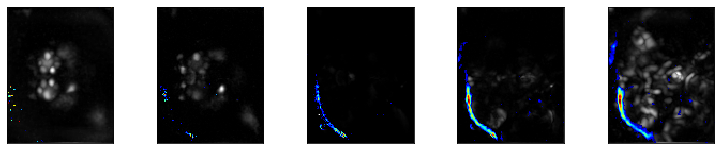

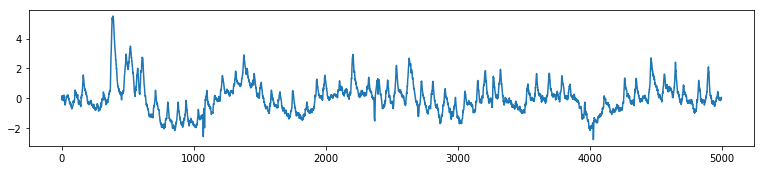


20


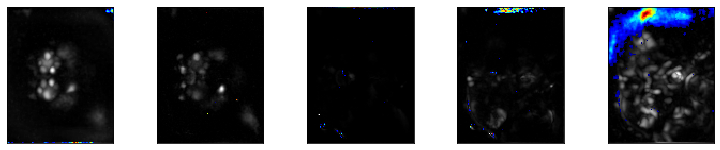

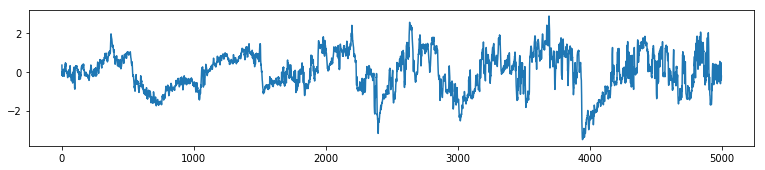


21


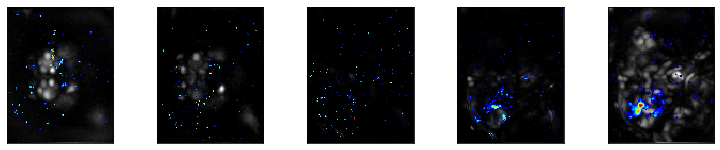

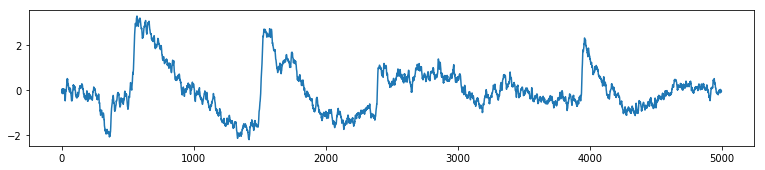


22


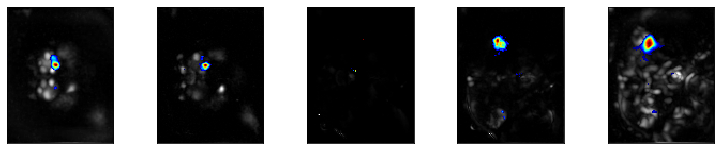

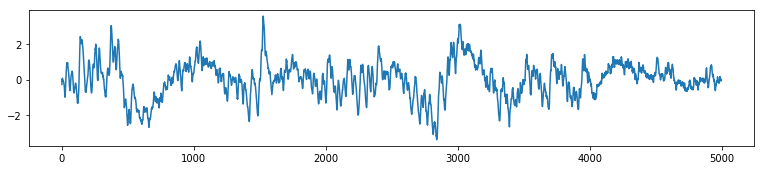

a
23


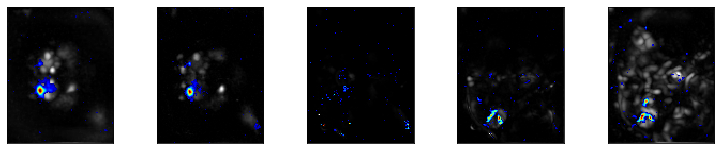

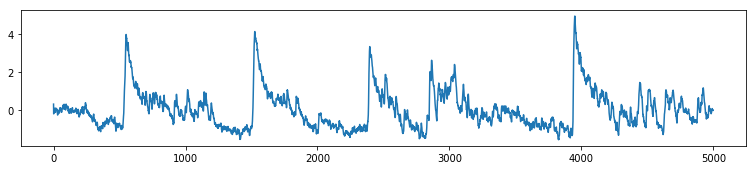

a
24


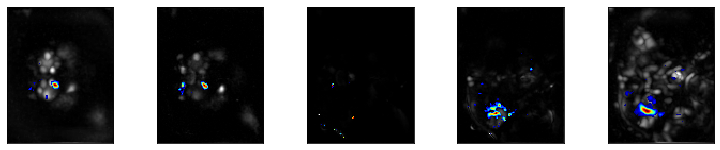

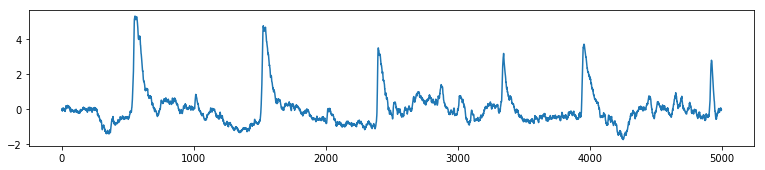

a
25


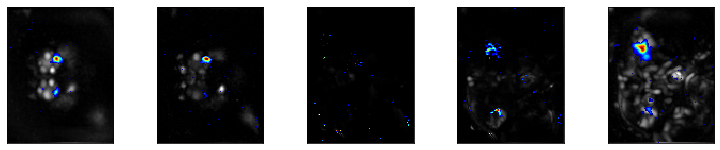

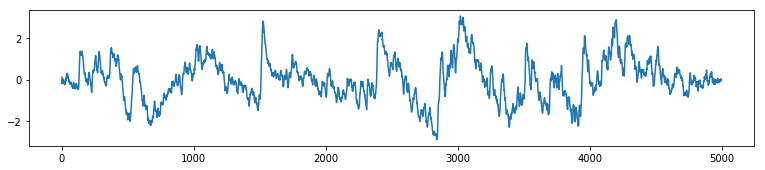

a
26


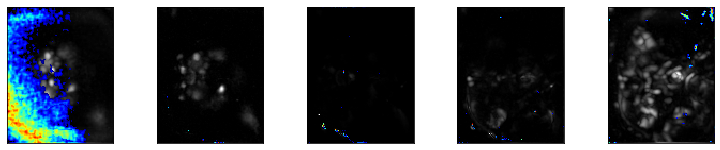

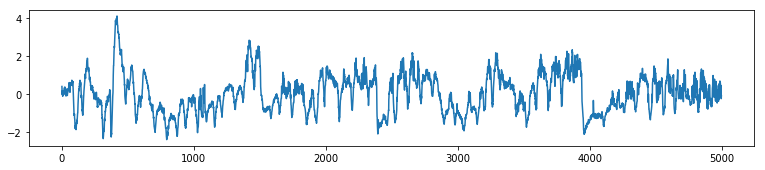


27


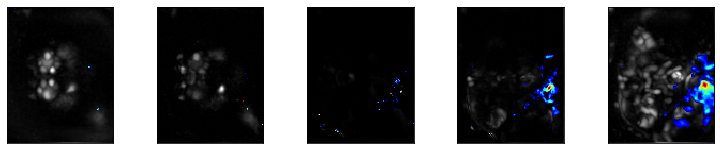

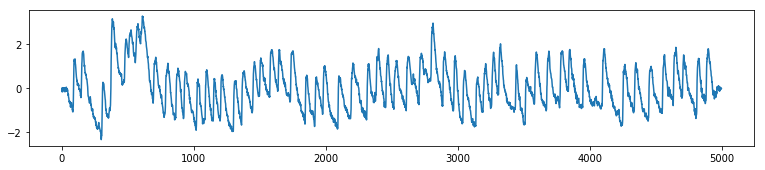


28


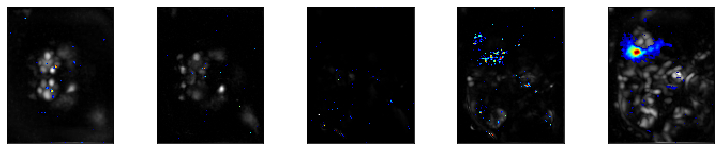

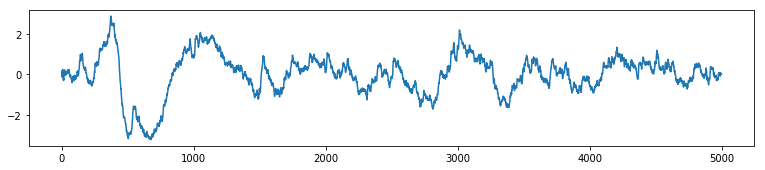


29


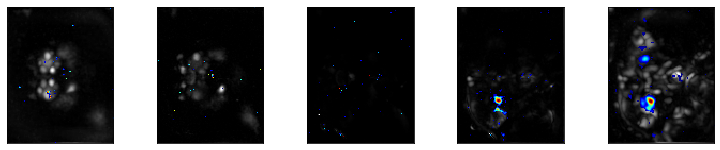

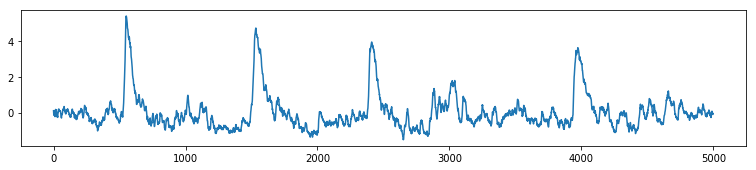

a
30


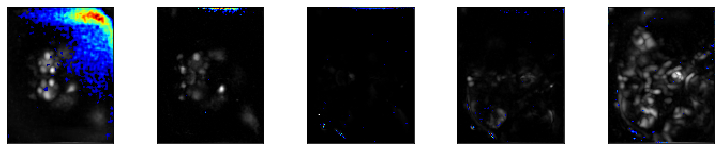

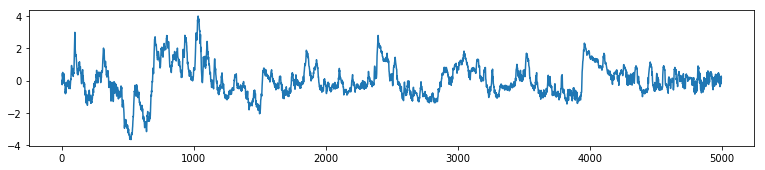


31


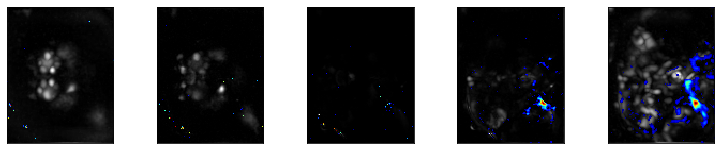

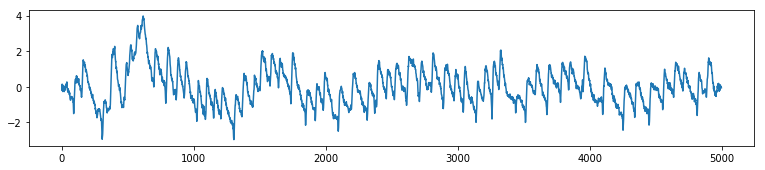


32


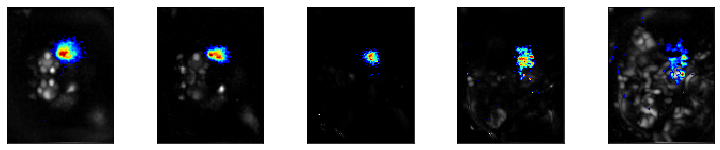

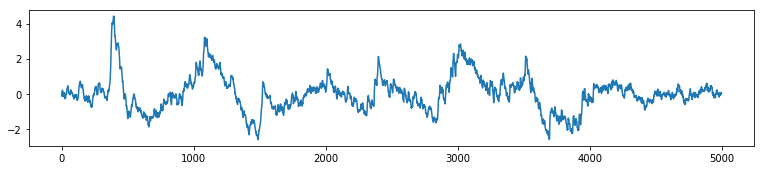

l
33


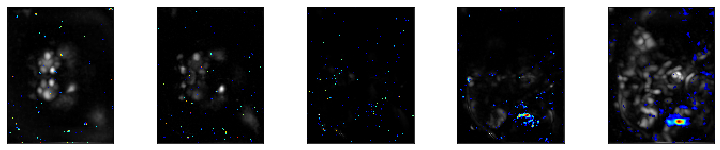

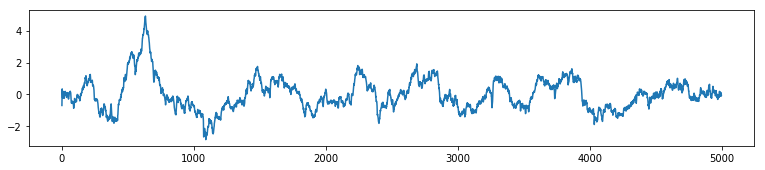


34


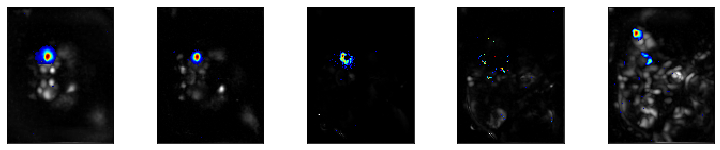

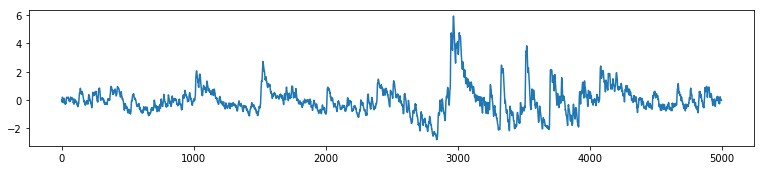

odor
35


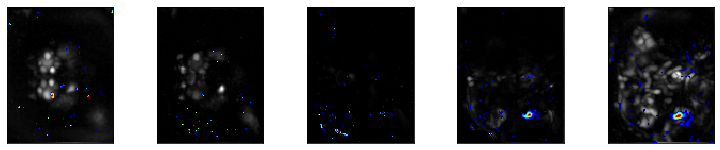

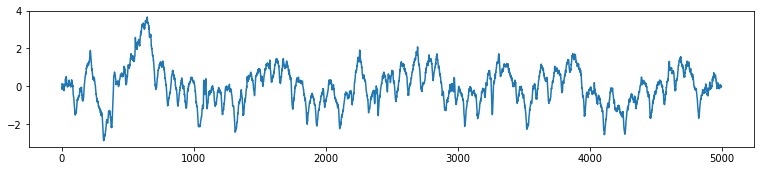


36


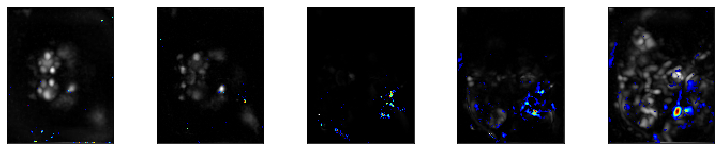

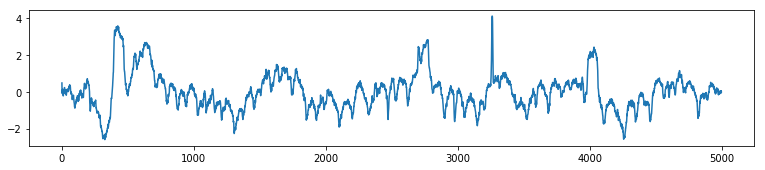


37


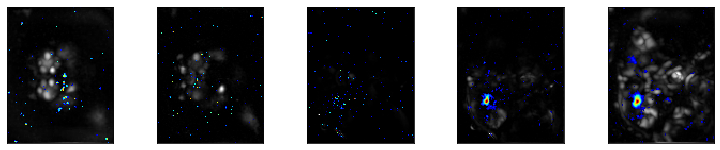

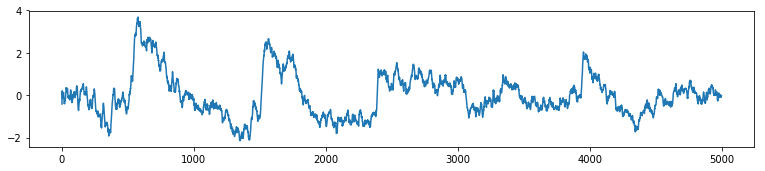


38


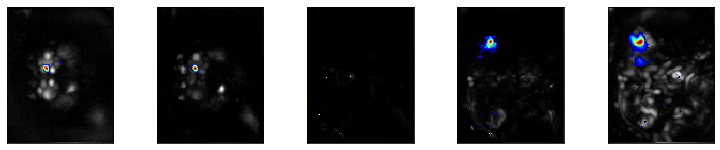

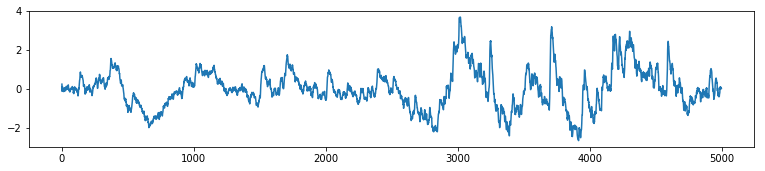

odor
39


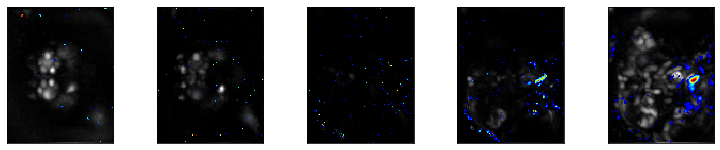

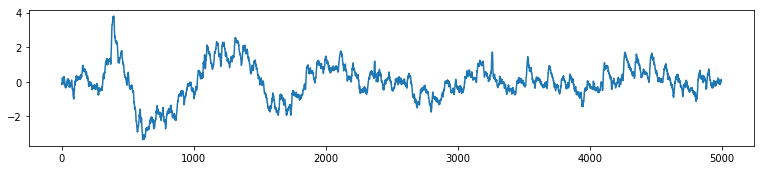


40


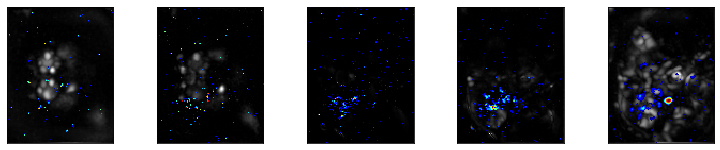

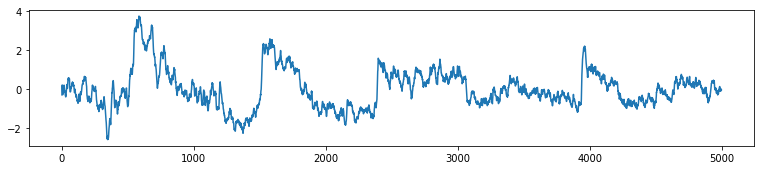


41


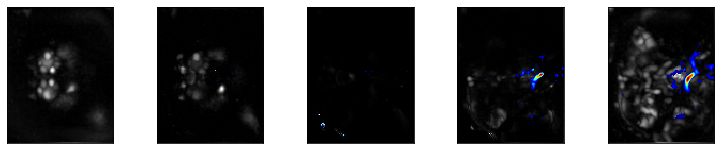

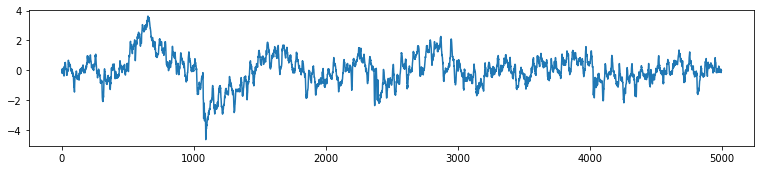


42


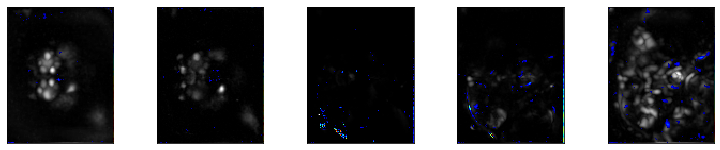

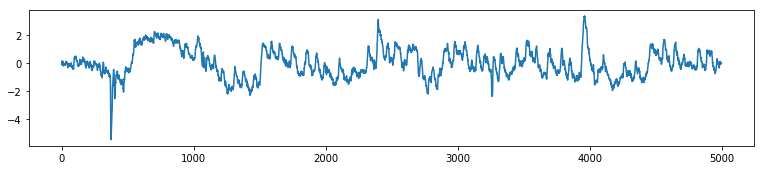


43


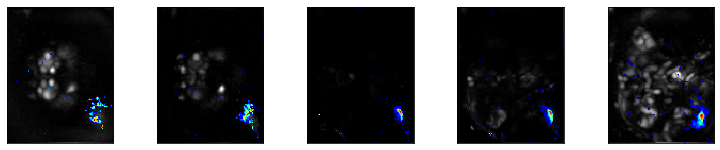

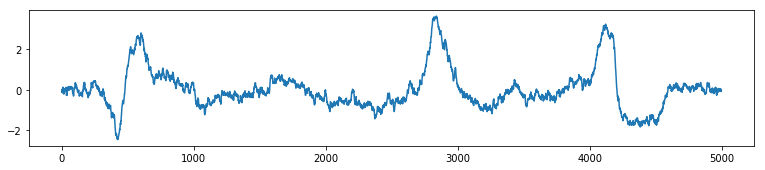


44


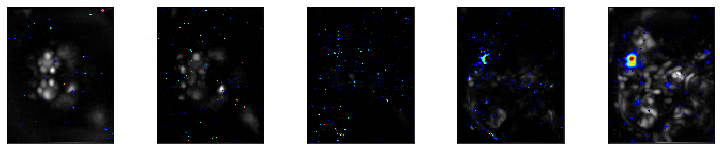

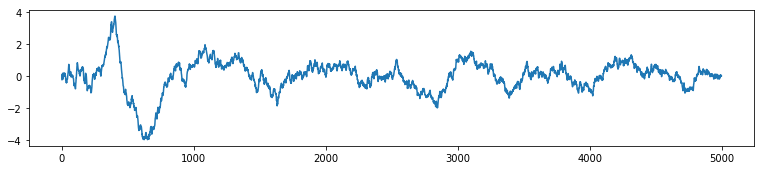


45


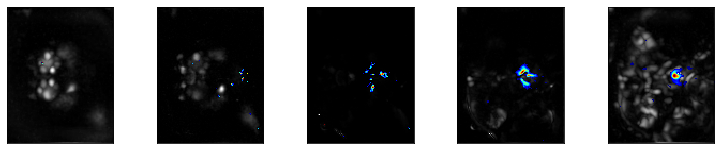

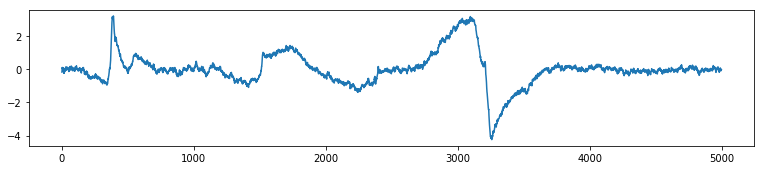


46


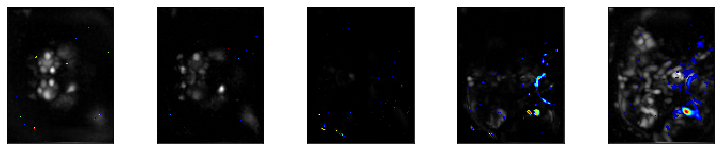

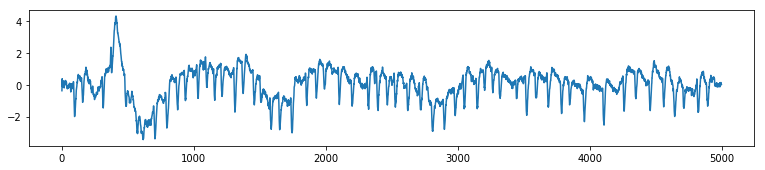


47


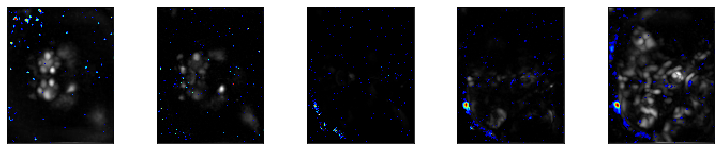

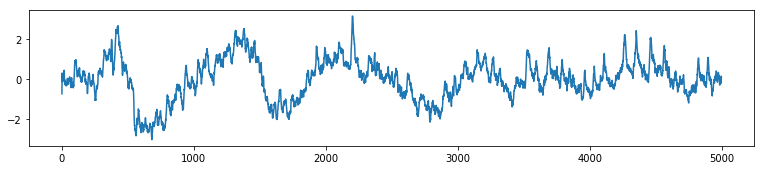


48


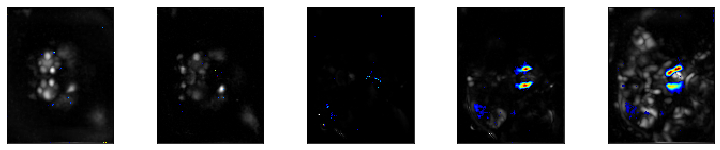

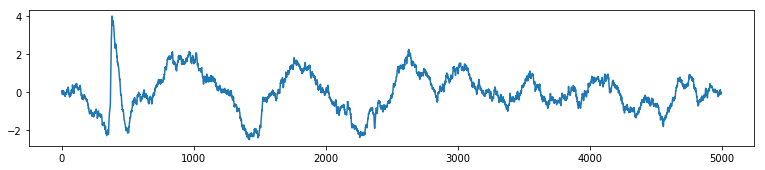


49


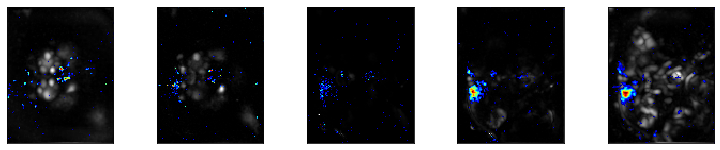

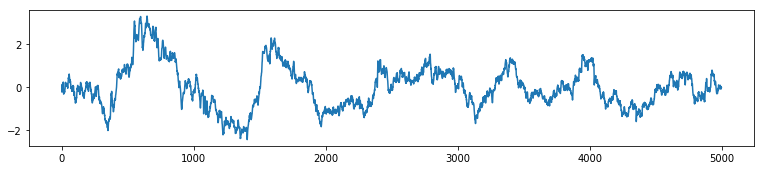


50


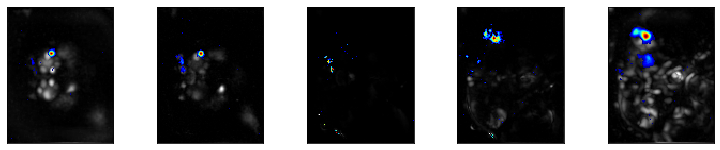

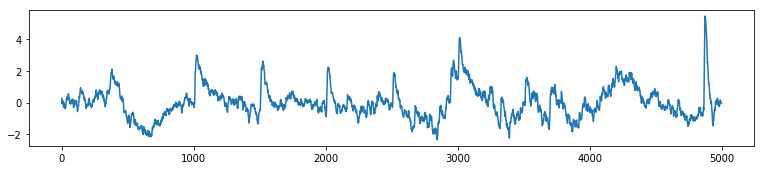

odor
51


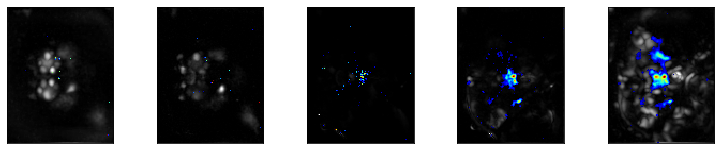

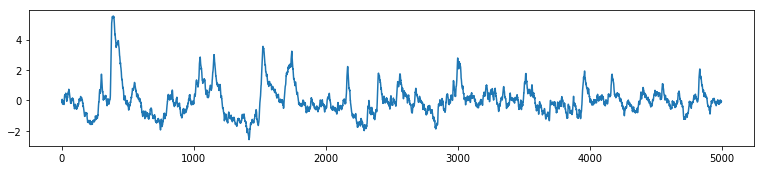


52


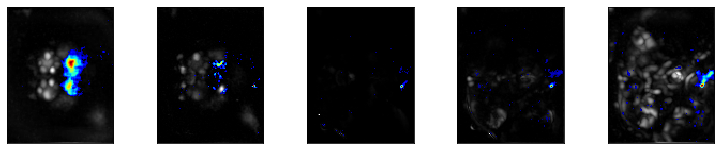

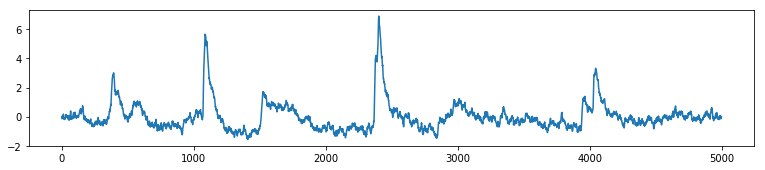

s
53


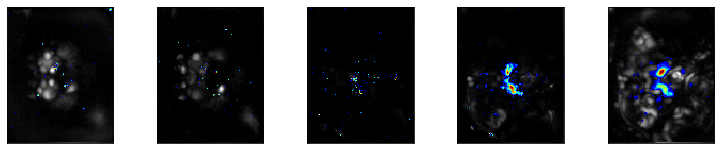

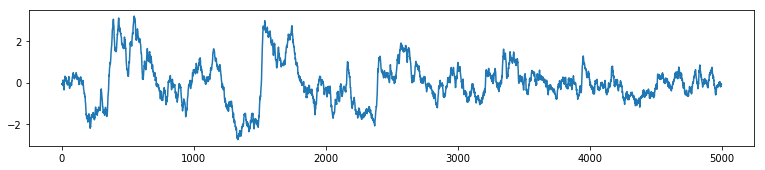

d
54


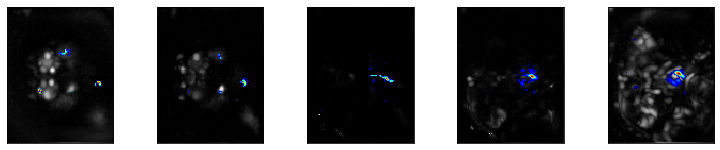

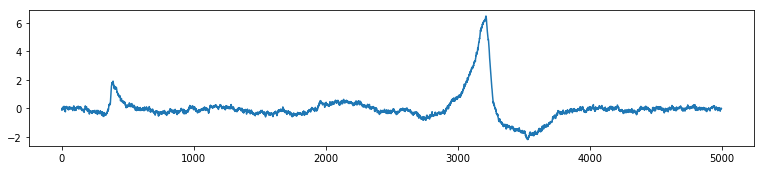


55


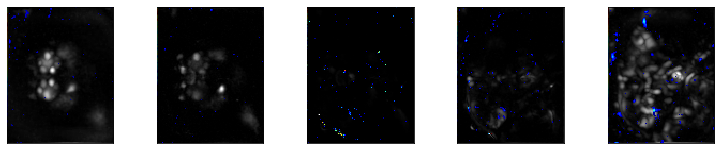

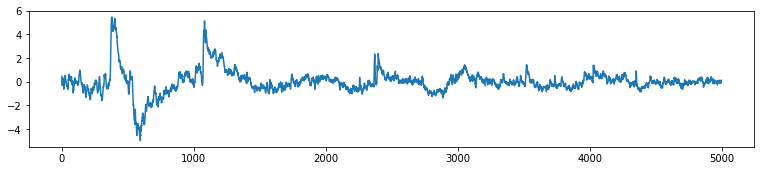


56


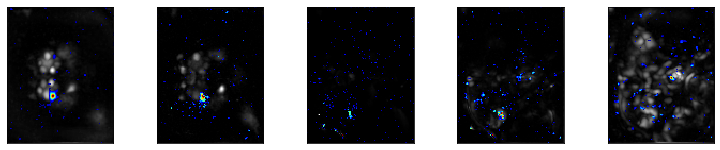

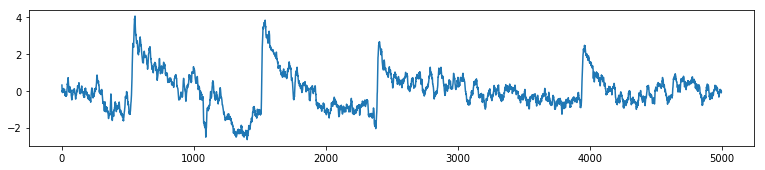


57


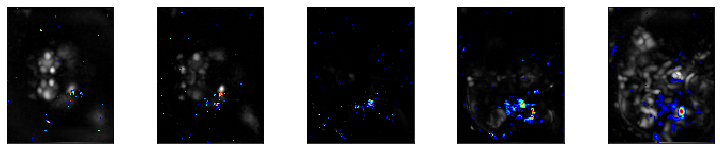

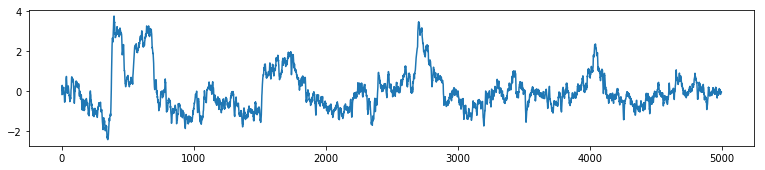


58


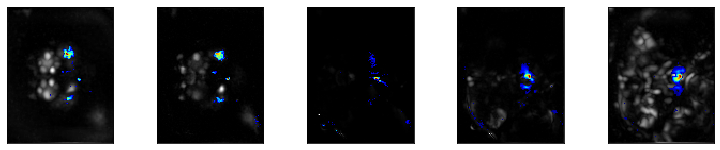

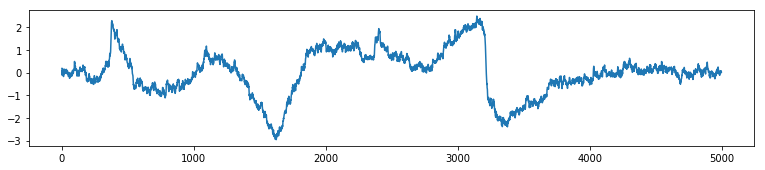


59


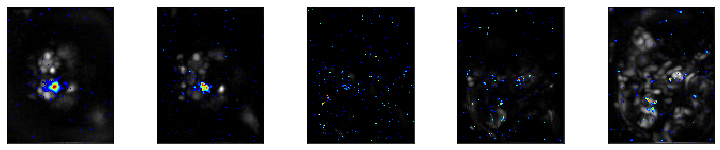

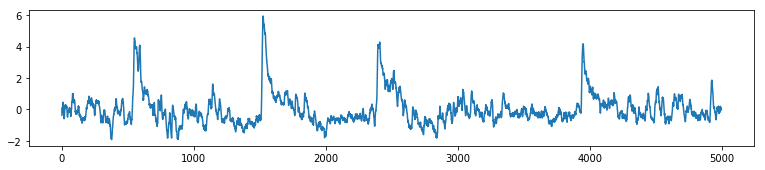

a
60


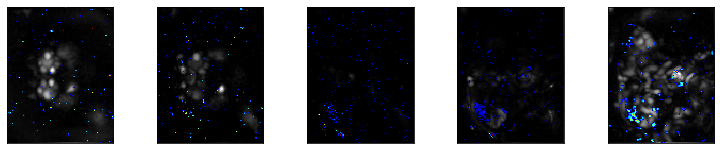

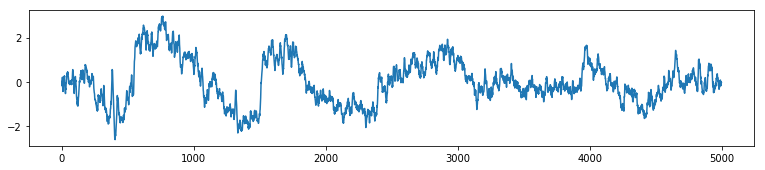


61


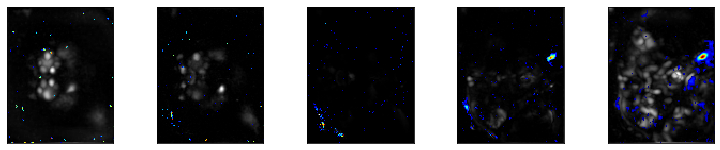

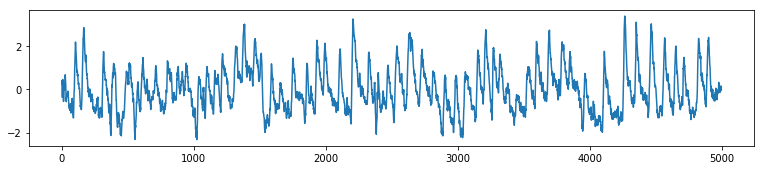


62


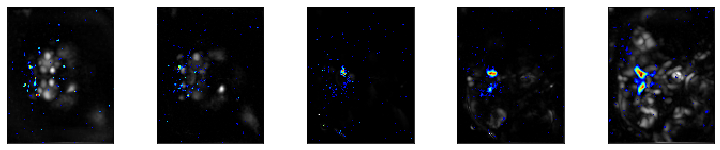

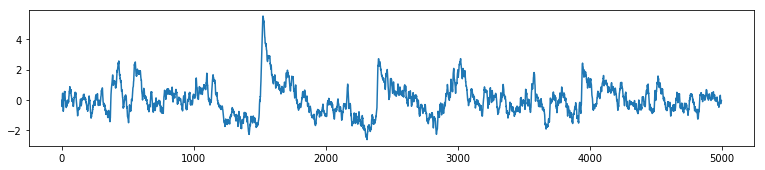

s
63


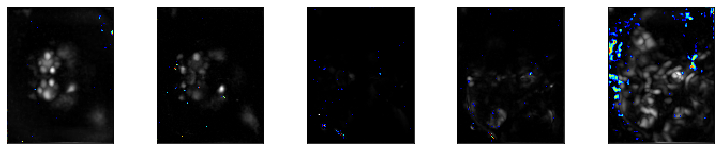

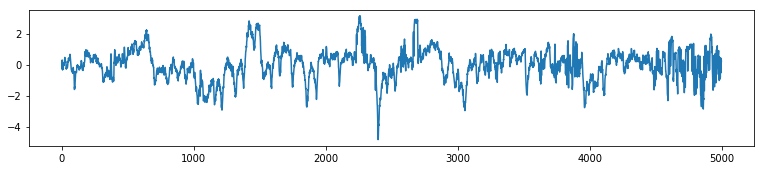


64


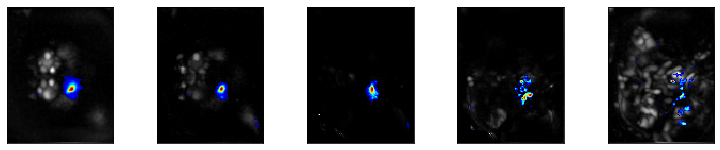

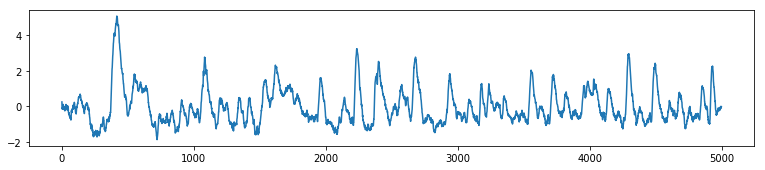

s
65


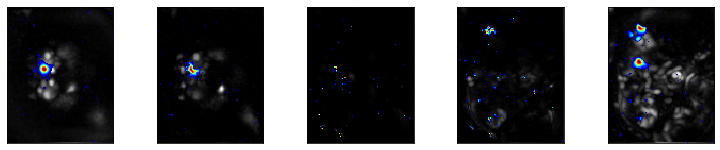

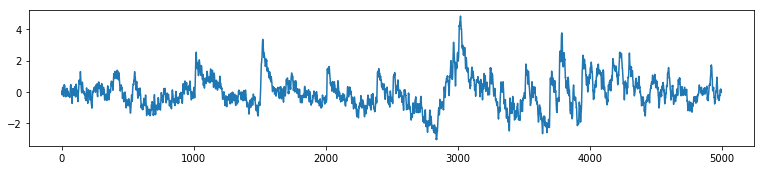

odor
66


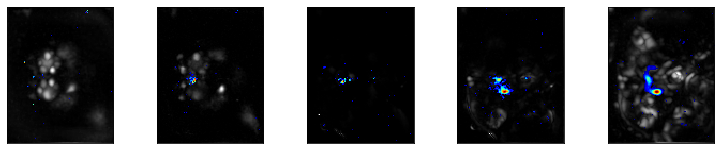

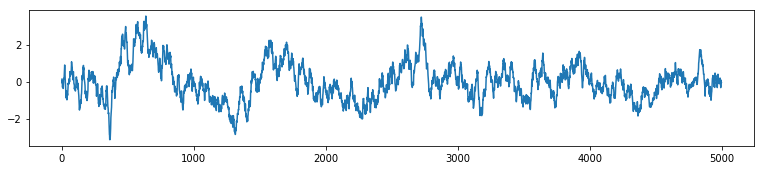

cc
67


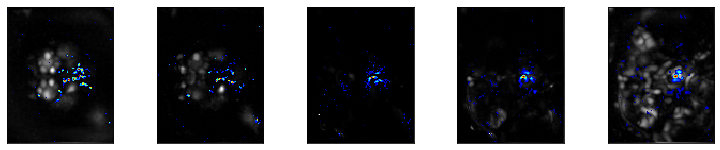

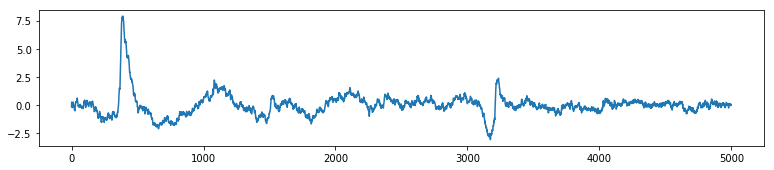


68


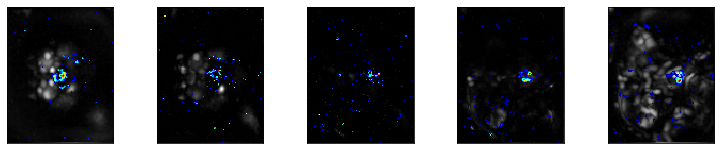

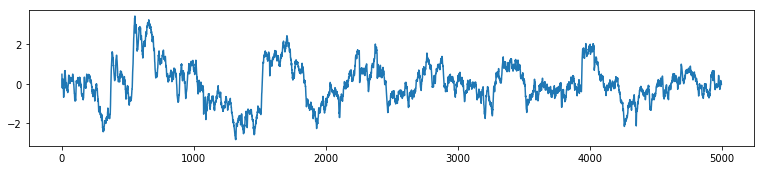


69


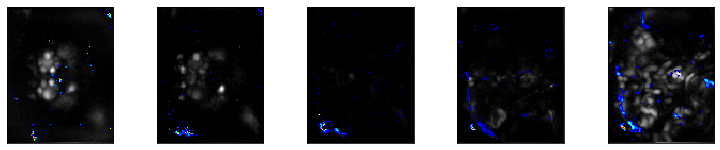

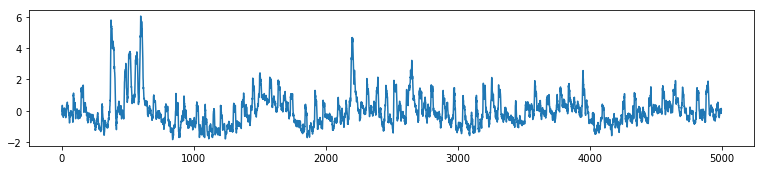


70


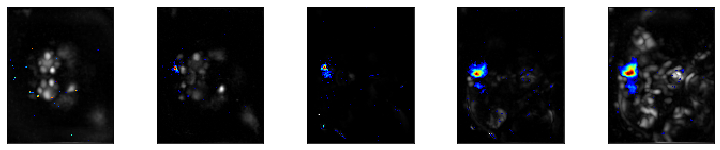

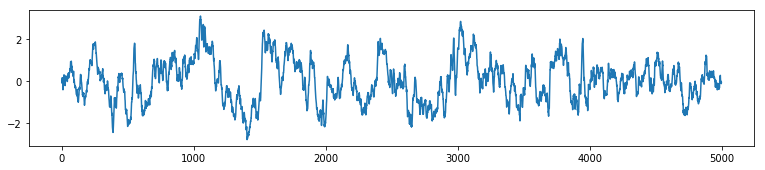

s
71


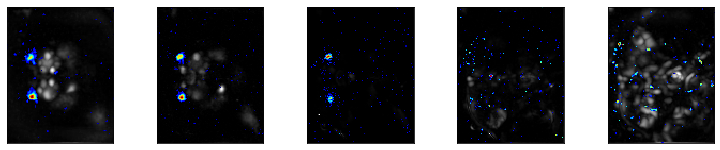

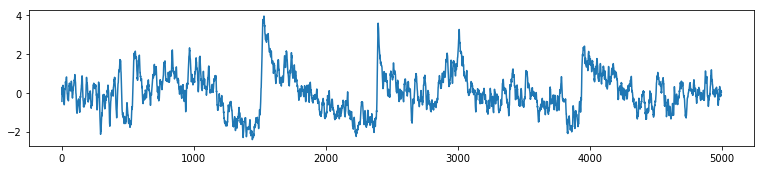

mb
72


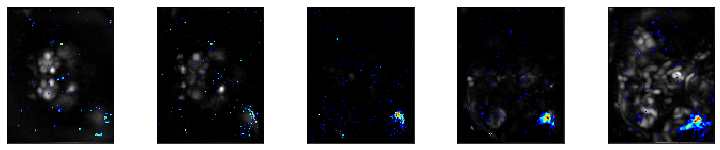

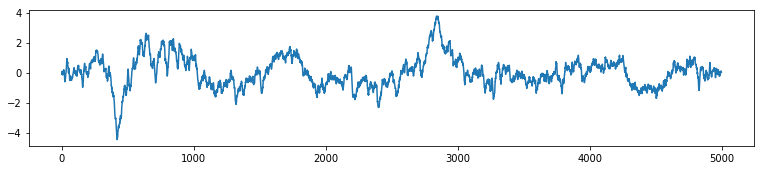


73


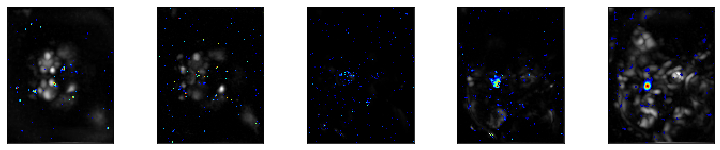

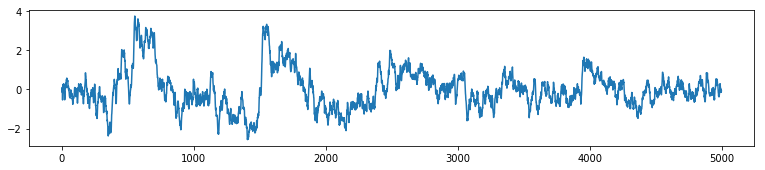


74


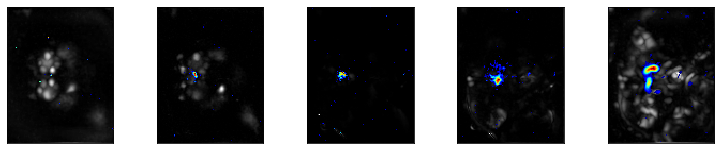

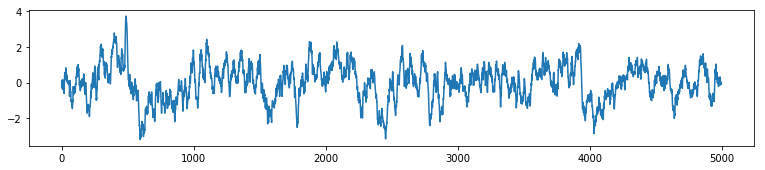

cc
75


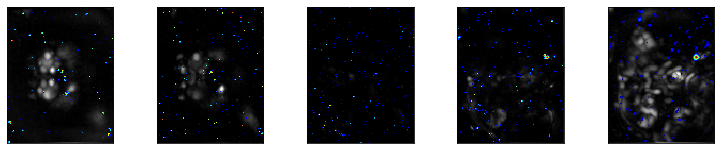

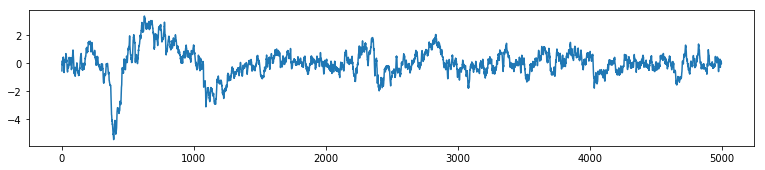


76


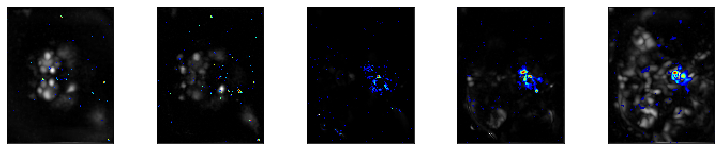

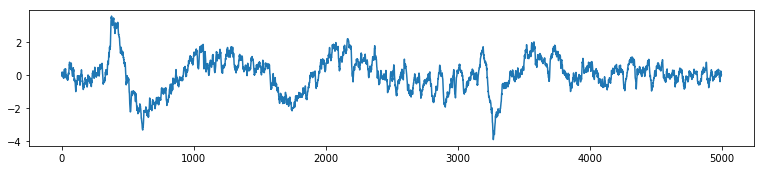


77


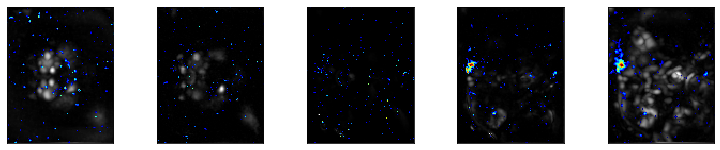

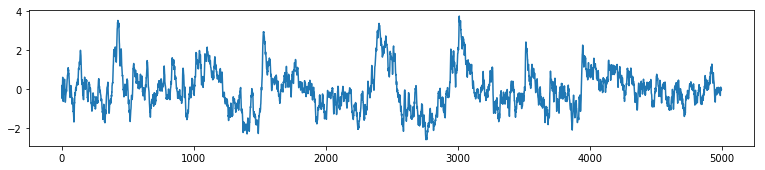


78


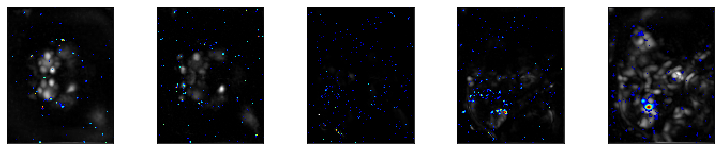

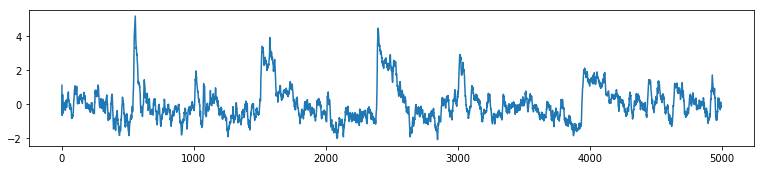


79


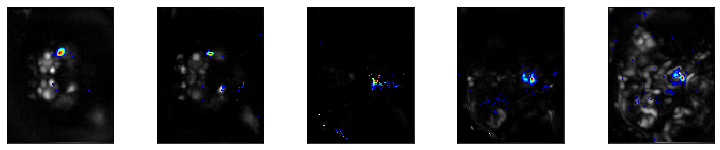

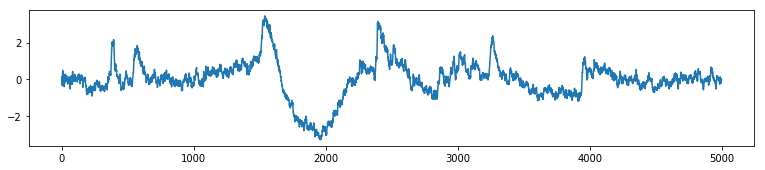

l
80


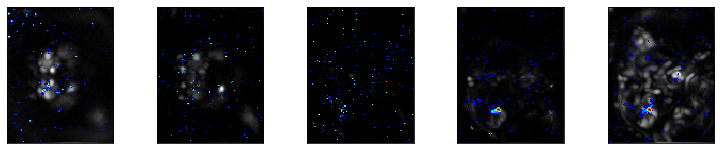

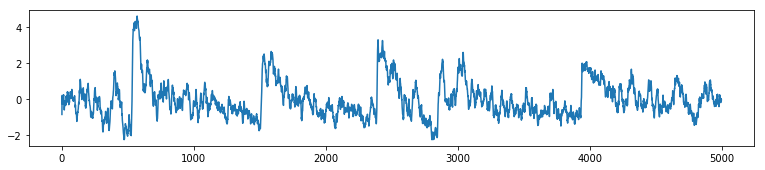


81


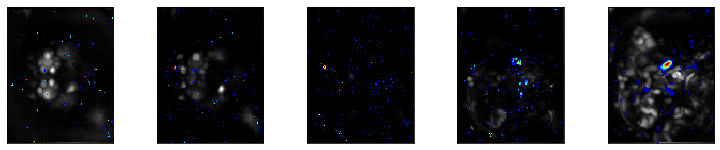

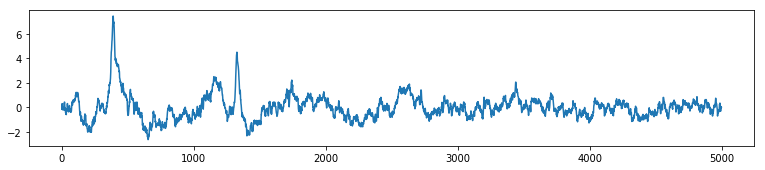


82


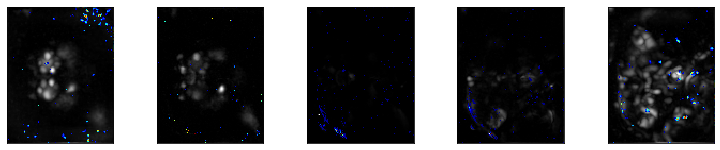

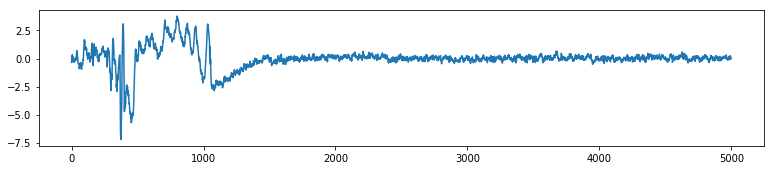


83


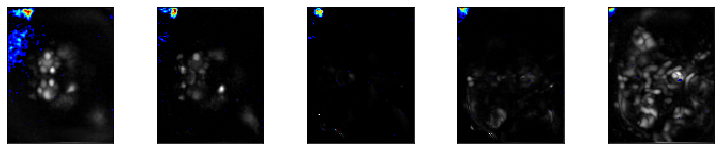

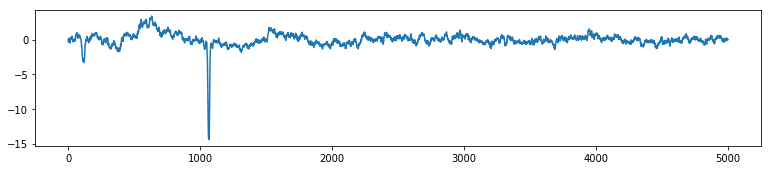


84


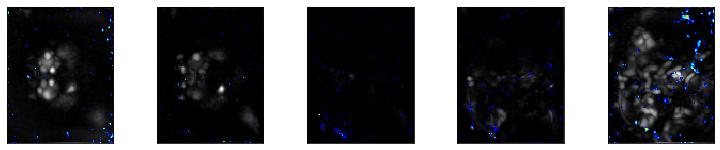

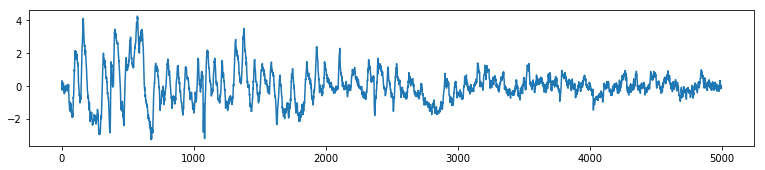


85


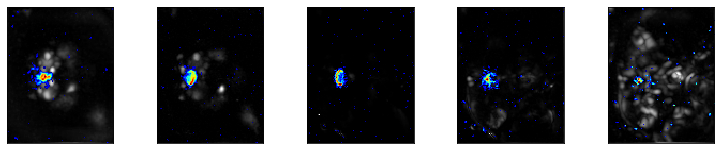

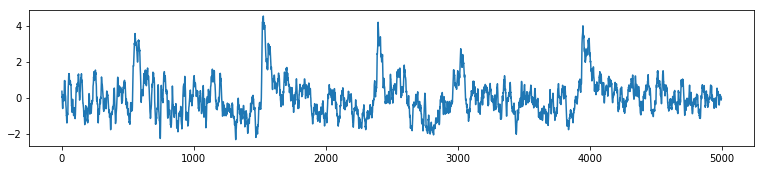

cc
86


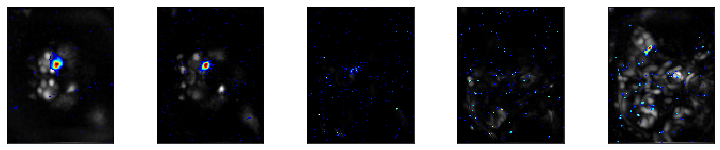

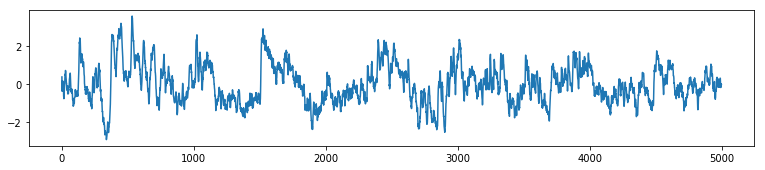

a
87


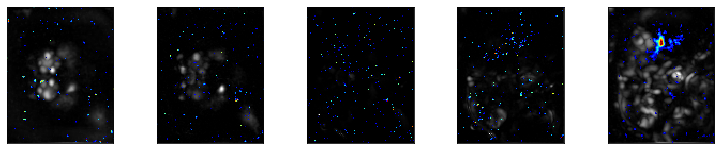

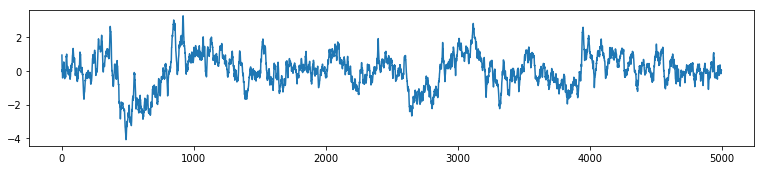


88


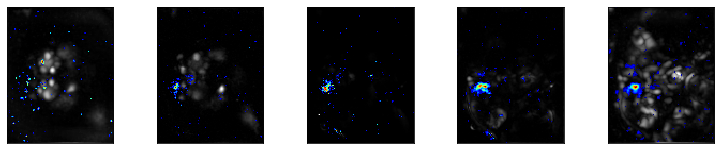

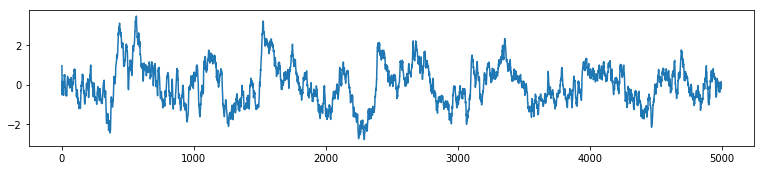

s
89


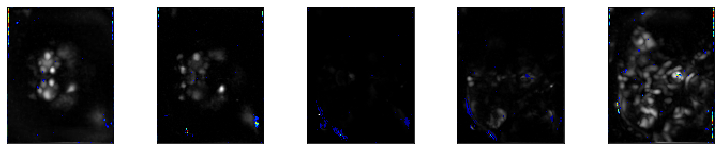

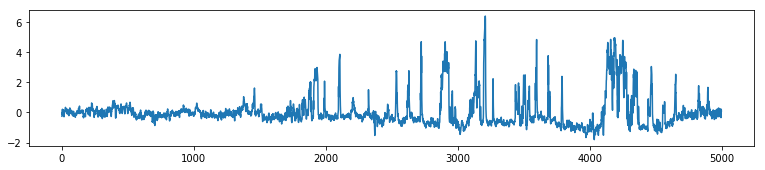


90


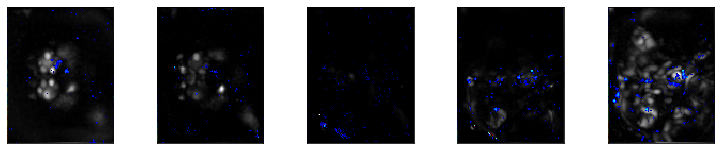

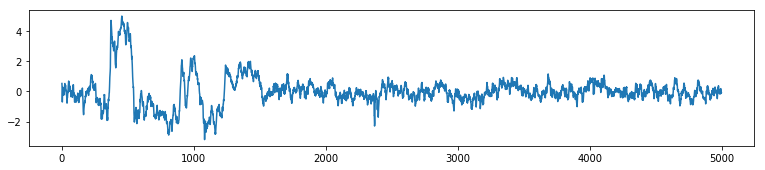


91


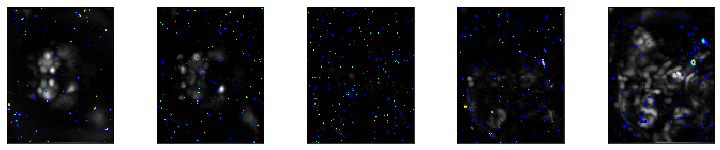

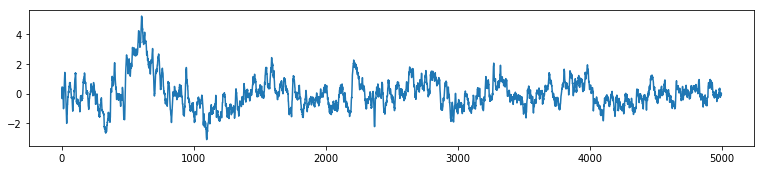


92


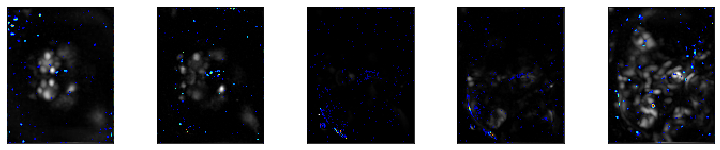

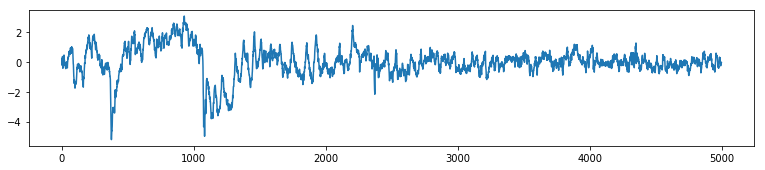


93


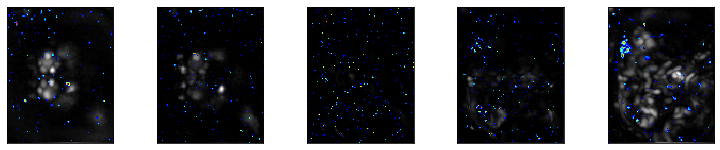

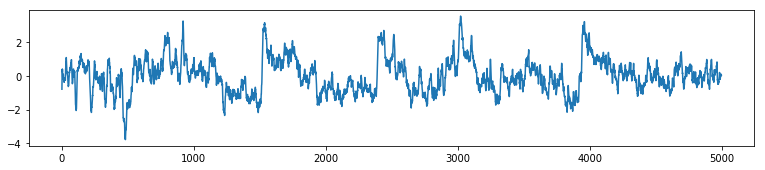


94


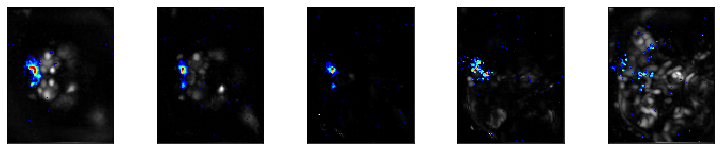

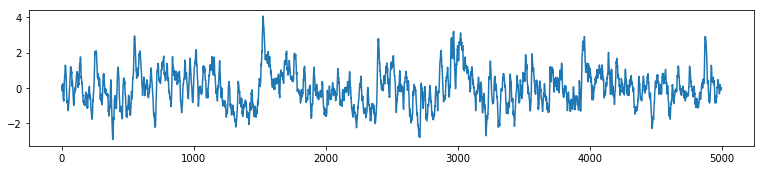

mb
95


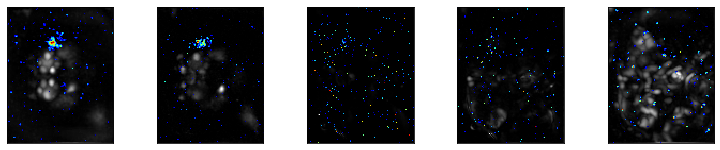

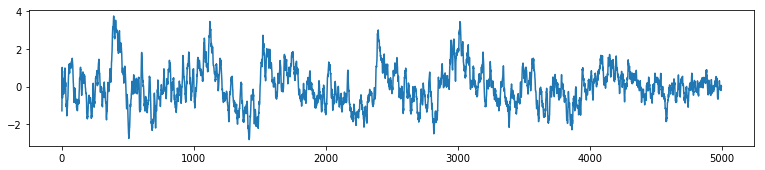


96


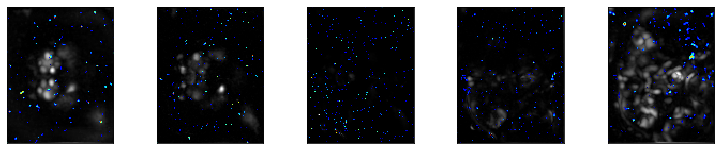

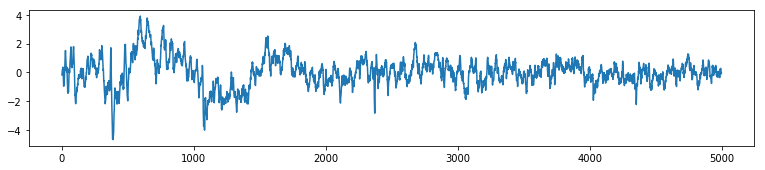


97


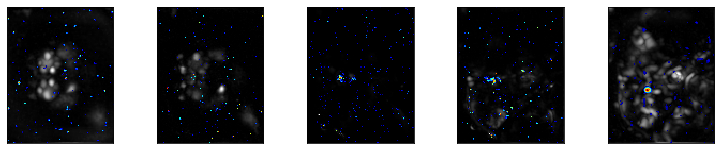

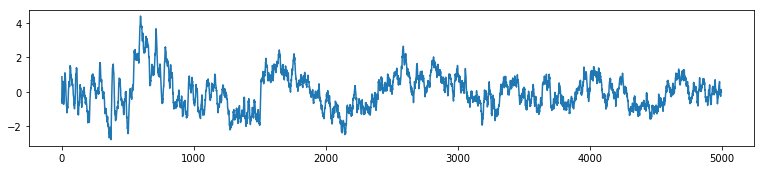


98


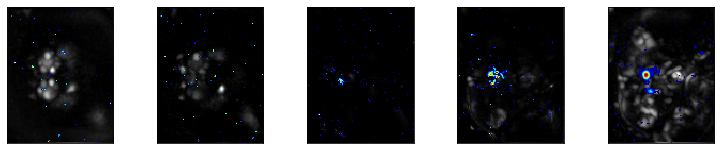

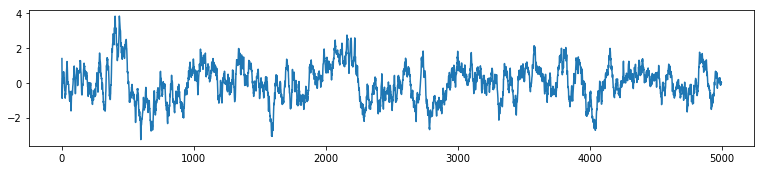


99


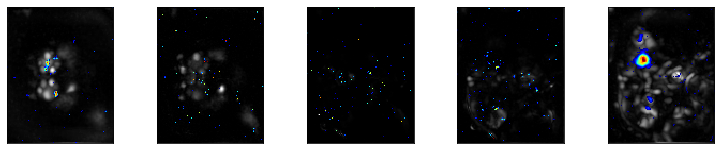

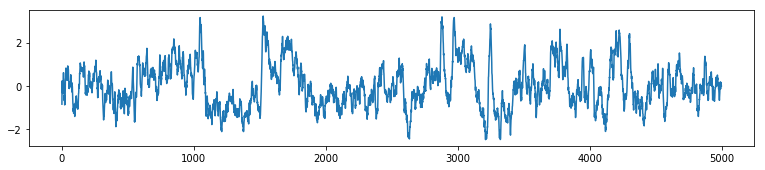

a
100


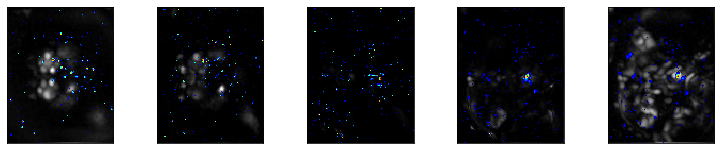

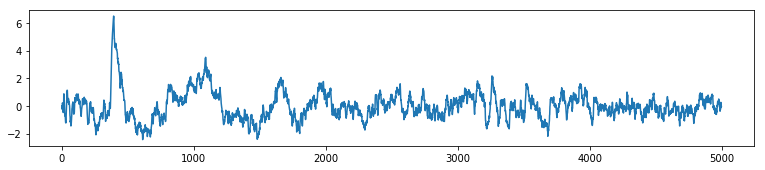


101


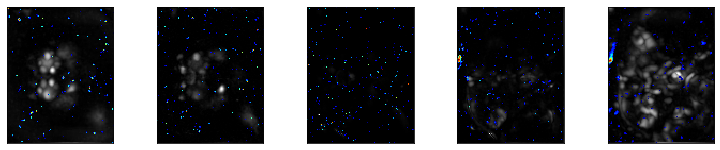

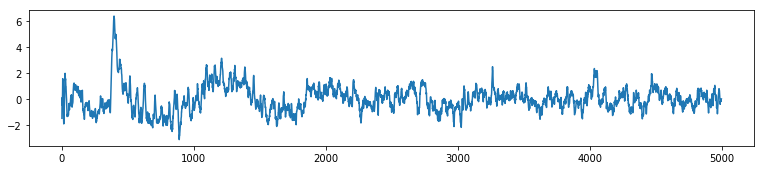


102


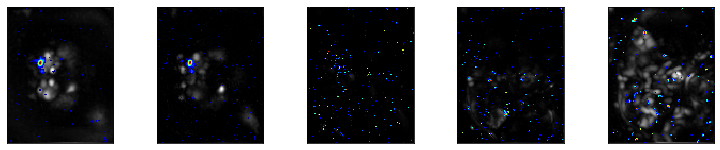

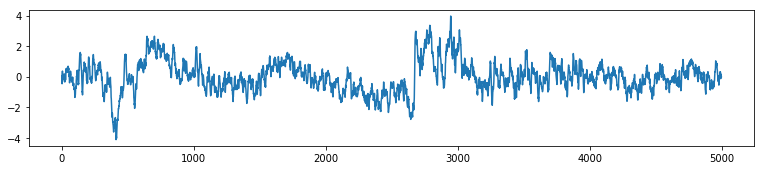

a
103


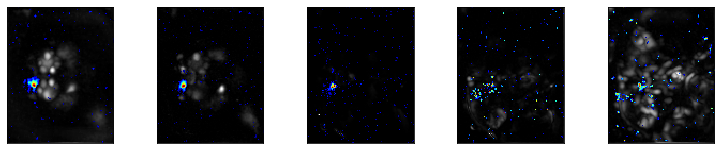

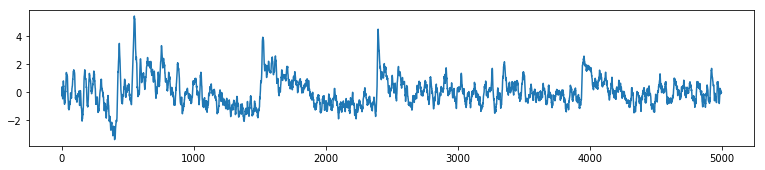

mb
104


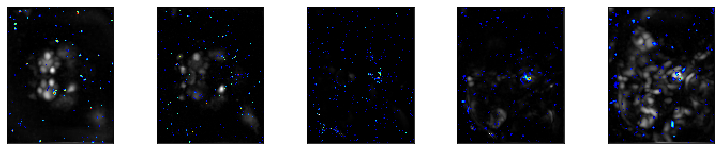

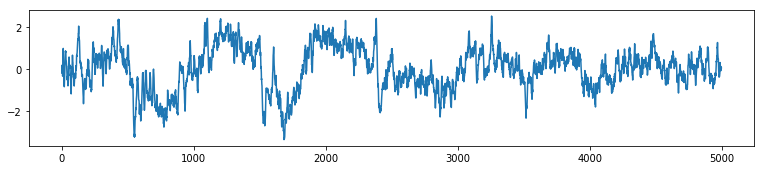


105


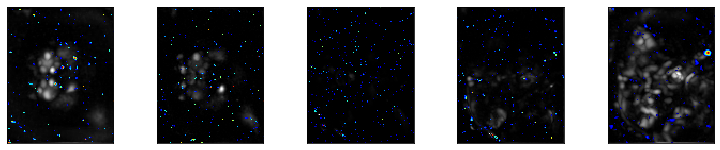

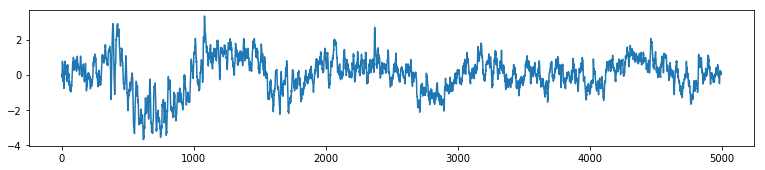


106


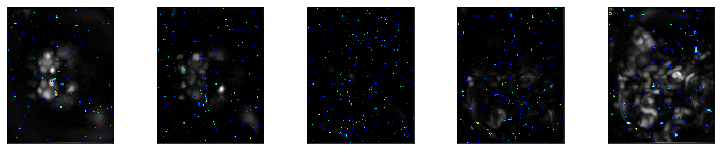

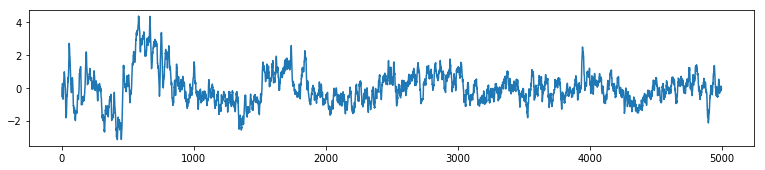


107


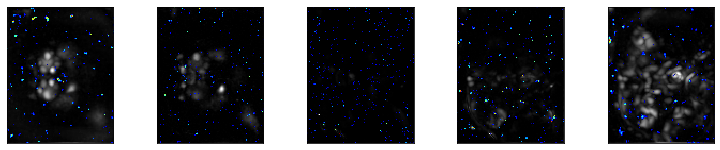

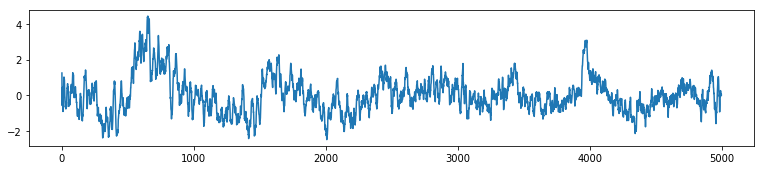


108


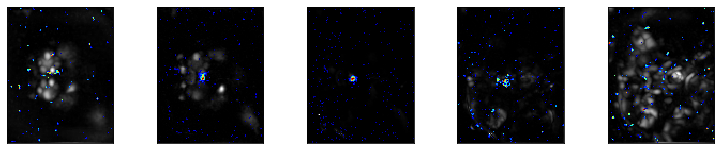

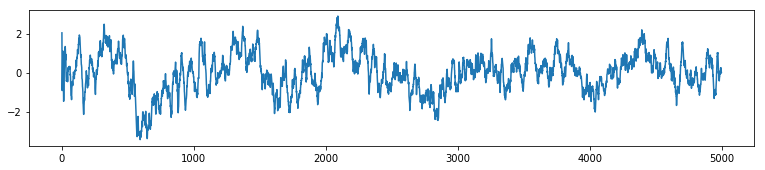


109


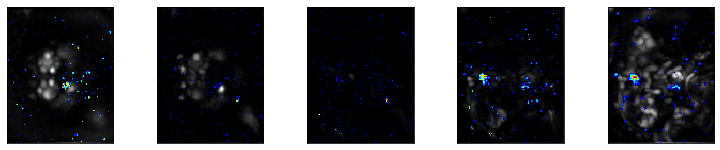

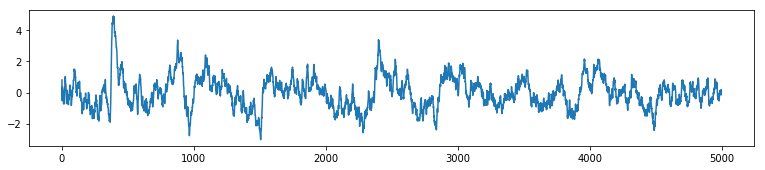


110


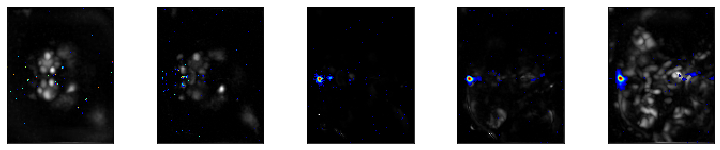

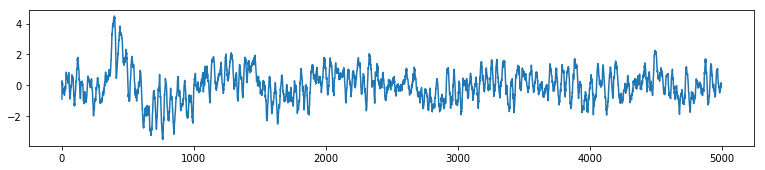


111


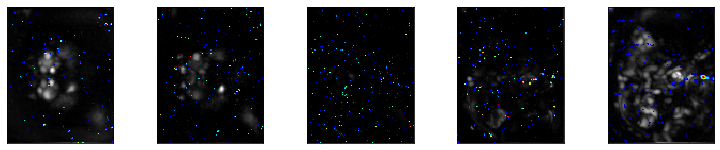

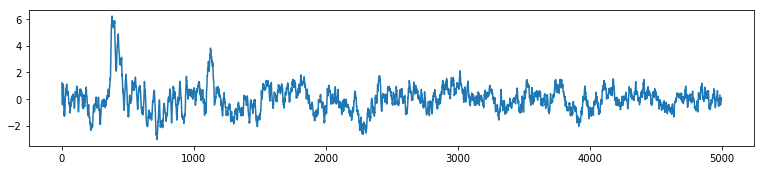


112


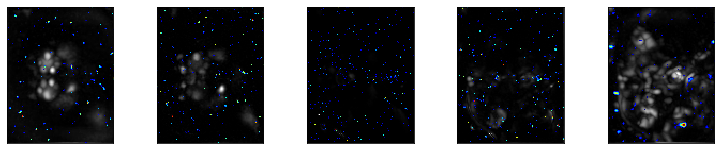

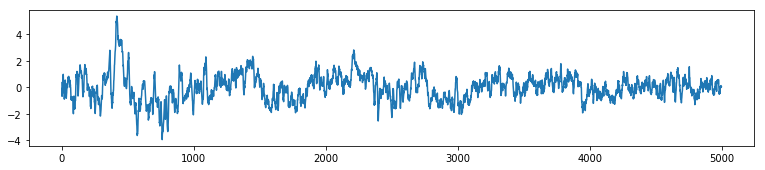


113


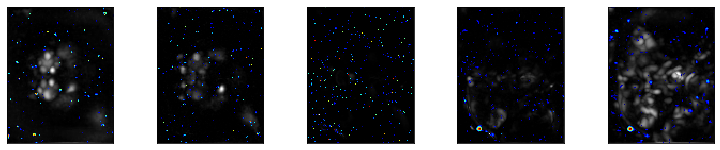

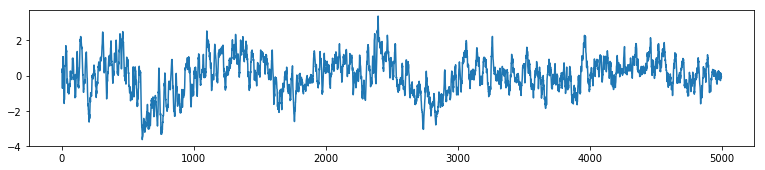


114


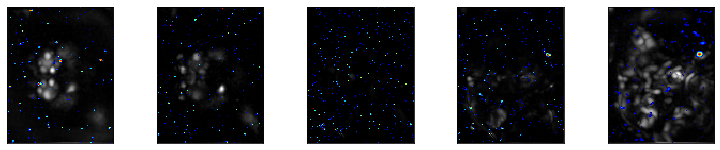

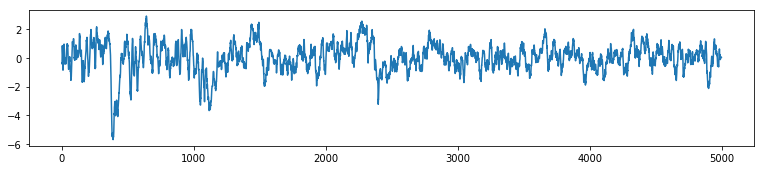

In [ ]:
for j in range(S[3]):

    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],j]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,j]
            D1[:,:,i]=V 
            

    print(j)
    for i in range(Nstack):
        plt.subplot(1,5,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        
    plt.show()
    
   # plt.plot(TS_ROI[Order[j],:])
    plt.plot(DTvar[:,j])
    #plt.plot(Xk[:,0]/np.std(Xk[:,0])+0.5,color=(1,0,0))   
    #plt.plot(Xk[:,1]/np.std(Xk[:,1])+0.5,color=(0,1,0))
    #plt.plot(Xk[:,2]/np.std(Xk[:,2])+0.5,color=(0.5,0.5,0))    
    #CCry=np.correlate(DTvar[:,j],Xkdff[0,:]+Xkdff[1,:]+Xkdff[2,:],'full')
    
    plt.show()
    #plt.plot(CCry-3)   
    #plt.show()
    #print(np.argmax(CCry))
    Label_ICs.append(input())
    if Label_ICs[j]=='':
        Good_ICs[j]=0
    else:
        Good_ICs[j]=1
        
        

In [27]:
#Label_ICs[91]='gamma'
Label_ICs

['c',
 'v',
 '',
 'a',
 '',
 '',
 'c',
 'd',
 'v',
 'v',
 'v',
 '',
 '',
 '',
 'v',
 '',
 '',
 '',
 'c',
 'v',
 '',
 '',
 '',
 'a',
 '',
 'c',
 'a',
 '',
 '',
 '',
 'v',
 '',
 '',
 '',
 'd',
 'a',
 'd',
 '',
 'a',
 '',
 'c',
 '',
 '',
 '',
 '',
 'c',
 '',
 '',
 '',
 'o',
 'c',
 'l',
 '',
 'm',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'l',
 '',
 '',
 '',
 'a',
 'm',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 'a',
 '',
 '',
 '',
 '',
 '',
 'a',
 'd',
 '',
 'a',
 '',
 'a',
 'mb',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 '',
 'a',
 '',
 '',
 '',
 '',
 '',
 '',
 'l',
 '',
 '',
 '',
 '',
 'mb',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 'd',
 '',
 '',
 'm',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'd',
 '',
 '',
 '',
 'v',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ''

In [28]:
Rsq=np.zeros((1,S[3]))
Betas=np.zeros((3,S[3]))

In [29]:
from sklearn import linear_model

In [33]:
algorithm = linear_model.LinearRegression()

In [33]:
for j in range(S[3]):
    model = algorithm.fit(Xkdff.T, DT[:,j])
    Betas[:,j] = model.coef_
    Rsq[:,j] = model.score(Xkdff.T,DT[:,j])

NameError: name 'Xkdff' is not defined

In [34]:
max(max(Rsq))

0.0

In [30]:
List1=[(Label_ICs[i],i) for i in range(S[3])]
Newlist=sorted(List1, key=lambda List1: List1[0])

Neworder=[Newlist[i][1] for i in range(S[3])]

NewDT=DTvar[:,Neworder[:]].T

for j in range(len(Neworder)):
    A=NewDT[:,j]
    V=np.sqrt(np.var(A))
    NewDT[:,j]=A/V

In [31]:
C1=np.zeros([16,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)
C1[6][:]=(1,0.5,0)
C1[7][:]=(0,1,0.5)
C1[8][:]=(0.5,0,1)
C1[9][:]=(0.8,0.8,0.5)
C1[10][:]=(0.5,1,1)
C1[11][:]=(1,0.5,1)
C1[12]=(0.5,0.5,0.5)
C1[13]=(0.2,0.5,0.5)
C1[14]=(0.5,0.2,0.5)
C1[15]=(0.5,0.5,0.2)
h=3

In [32]:
Newmaps=Dmaps[:,:,:,Neworder[:]]

L=len(set([Label_ICs[Neworder[i]] for i in range(len(Neworder))]))

Regionmaps=np.zeros([S[0],S[1],L,3])
Datasort=np.zeros([S[0],S[1],S[2],L,3])

Regionname=[]

DMapsordered=Dmapso[:,:,:,Neworder[:]]

j=0
i=0
k=Label_ICs[Neworder[0]]
m=0
Regionname.append(Label_ICs[Neworder[i]])

In [33]:
for i in range(len(Neworder)):
    
    #C2=C1[i%6][:]
    for l in range(3):
        M=np.max(np.squeeze(np.reshape(Newmaps[:,:,:,i],S[0]*S[1]*S[2])))
        Regionmaps[:,:,j,l]=Regionmaps[:,:,j,l]+0.6*np.max(DMapsordered[:,:,:,i],2)*C1[i%12+1][l]/M
        Datasort[:,:,:,j,l]=Datasort[:,:,:,j,l]+Dmaps[:,:,:,Neworder[i]]*C1[i%15+1][l] 
    i=i+1
    m=m+1
    if i<len(Neworder):
        k1=Label_ICs[Neworder[i]]
        
        
    if k1 != k:
        j=j+1
        k=k1
        m=0
        Regionname.append(Label_ICs[Neworder[i]])

2
4
5
11
12
13
15
16
17
20
21
22
24
27
28
29
31
32
33
37
39
41
42
43
44
46
47
48
52
54
55
56
57
58
59
60
61
63
64
65
68
69
70
71
72
73
75
76
78
79
80
81
82
85
87
90
91
92
93
94
95
97
98
99
101
102
103
104
105
106
108
109
110
111
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
129
130
132
133
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
160
161
162
164
165
166
167
168
169
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211


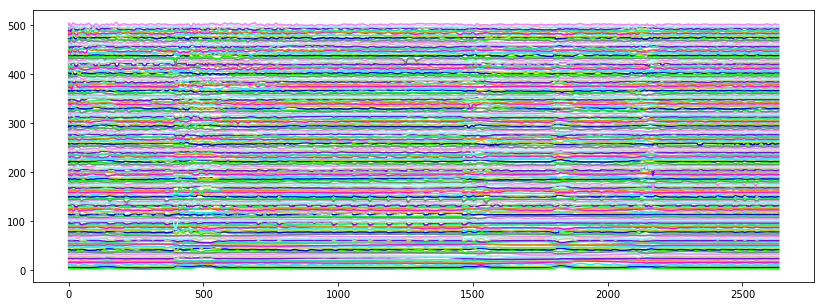

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3
23
26
35
38
66
74
77
83
86
88
96
100
128
170


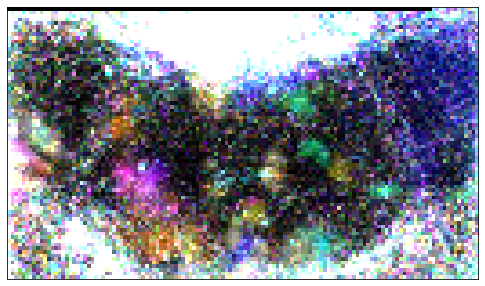

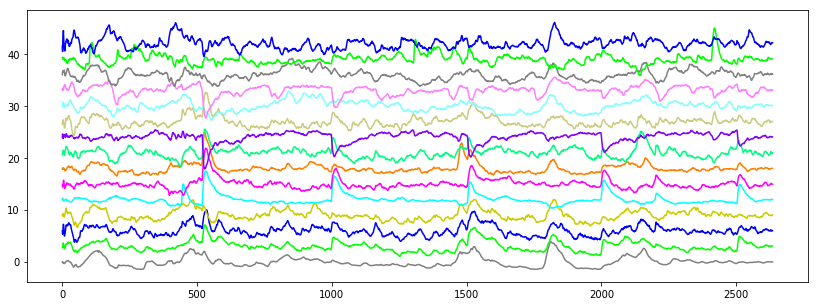

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0
6
18
25
40
45
50


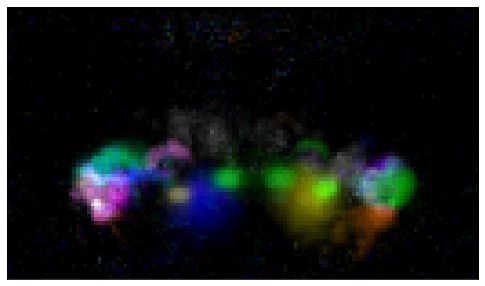

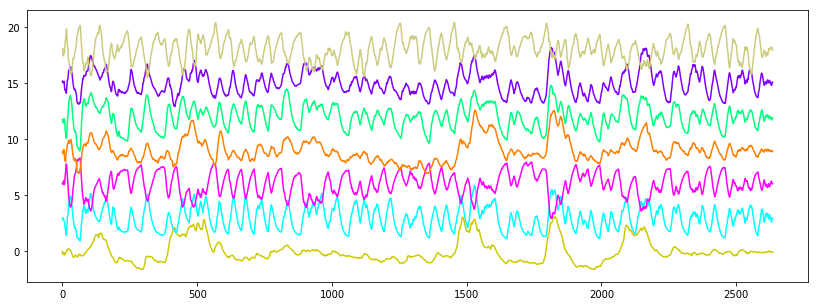

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7
34
36
84
131
159


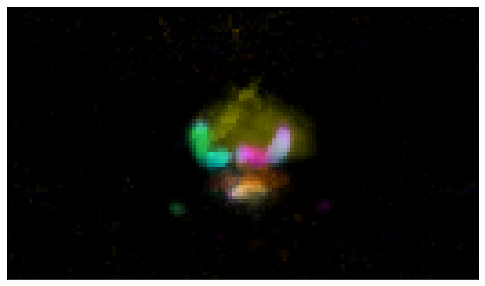

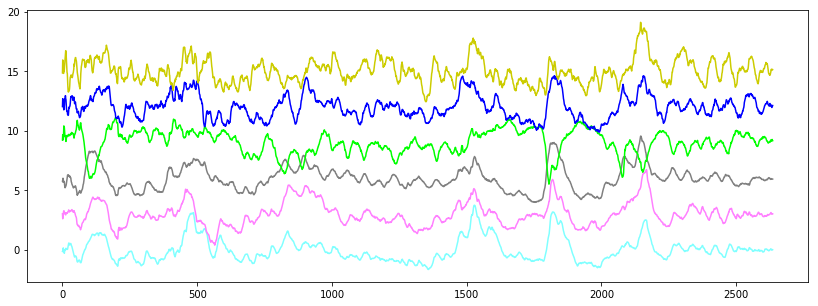

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


51
62
107


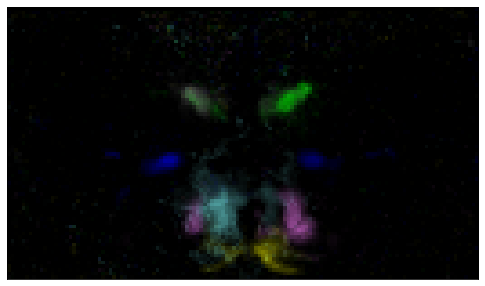

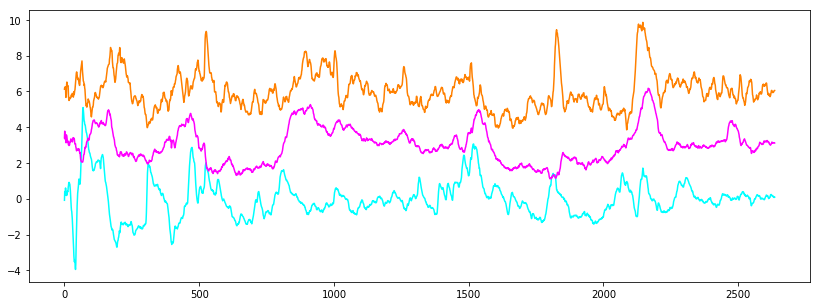

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


53
67
134


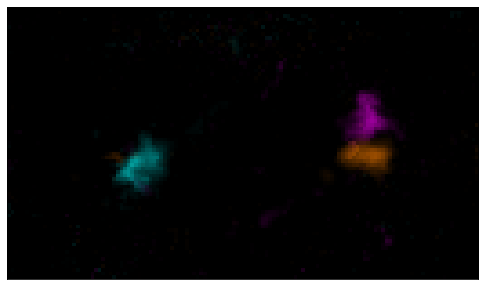

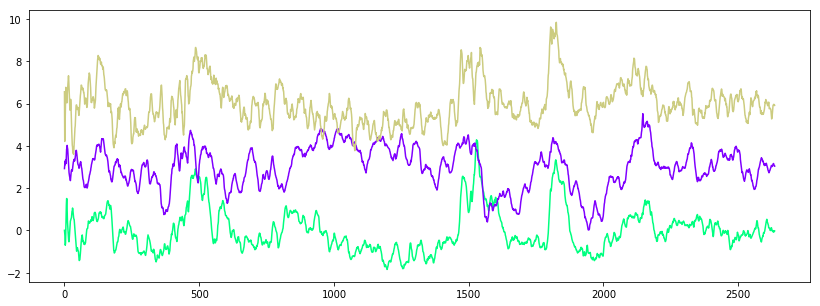

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


89
112


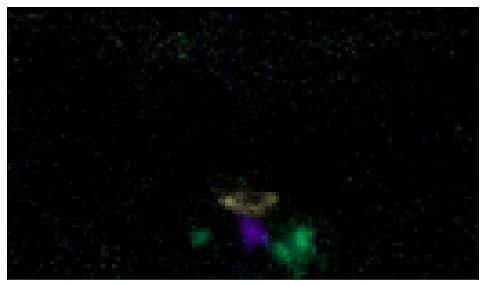

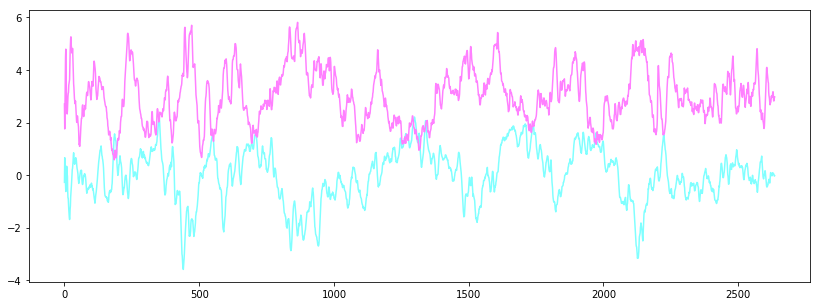

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


49


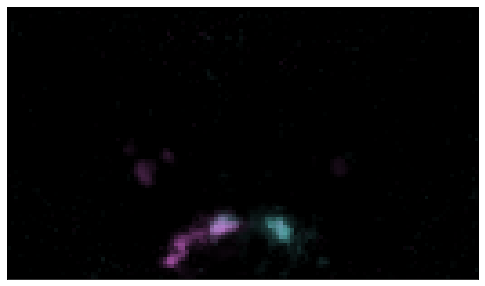

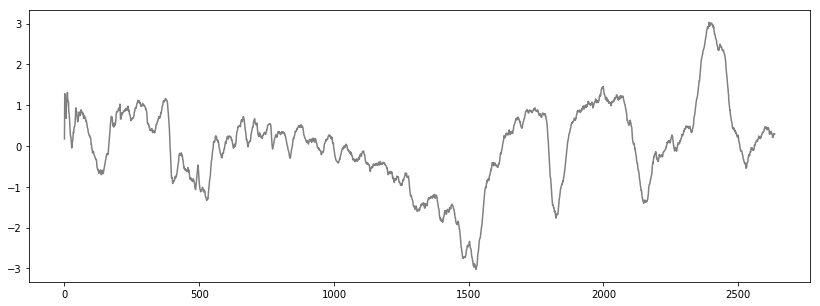

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1
8
9
10
14
19
30
163
[2, 4, 5, 11, 12, 13, 15, 16, 17, 20, 21, 22, 24, 27, 28, 29, 31, 32, 33, 37, 39, 41, 42, 43, 44, 46, 47, 48, 52, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 68, 69, 70, 71, 72, 73, 75, 76, 78, 79, 80, 81, 82, 85, 87, 90, 91, 92, 93, 94, 95, 97, 98, 99, 101, 102, 103, 104, 105, 106, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 129, 130, 132, 133, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 164, 165, 166, 167, 168, 169, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 3, 23, 26, 35, 38, 66, 74, 77, 83, 86, 88, 96, 100, 128, 170, 0, 6, 18, 25, 40, 45, 50, 7, 34, 36, 84, 131, 159, 51, 62, 107, 53, 67, 134, 89, 112, 49, 1, 8, 9, 10, 14, 19, 30, 163]


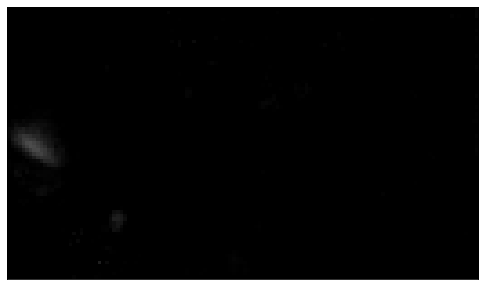

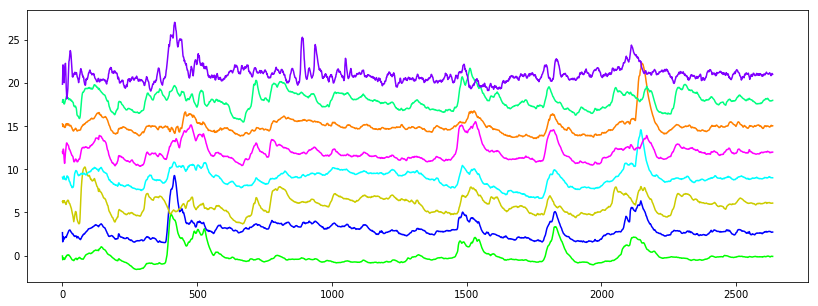

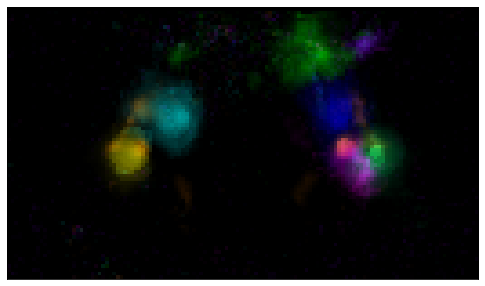

In [34]:
pylab.rcParams['figure.figsize'] = (14, 5)
import scipy
from scipy import ndimage
j=0
m=0
L=0
k=Label_ICs[Neworder[0]]
for i in range(len(Neworder)):
    m=m+1
    
    
    if i<len(Neworder):
        k1=Label_ICs[Neworder[i]]
        
    if k1 != k:
        
        
        k=k1
        m=0
        
        plt.show()
        plt.figure(2*j+1)
        Rotated_Plot = ndimage.rotate(Regionmaps[:,:,j], -90)
        IM=plt.imshow(Rotated_Plot) 
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        j=j+1
        plt.figure(2*j)
        #plt.plot(Xk[:,0]/np.std(Xk[:,0])+0.5,color=(1,0,0))   
        #plt.plot(Xk[:,1]/np.std(Xk[:,1])+0.5,color=(0,1,0))
        #plt.plot(Xk[:,2]/np.std(Xk[:,2])+0.5,color=(0.5,0.5,0))    
       # plt.plot(Xk[0,:]/np.std(Xk[0,:])+0.5,color=(1,0,0))   
       ## plt.plot(Xk[1,:]/np.std(Xk[1,:])+0.5,color=(0,1,0))
       # plt.plot(Xk[2,:]/np.std(Xk[1,:])+0.5,color=(0.5,0.5,0))    
        #plt.plot(Xk[3,:]/np.std(Xk[1,:])+0.5,color=(0,0.5,1))
    plt.plot(NewDT[i,:]+h*m,color=C1[i%12+1][:])
    print(Neworder[i])
    #print(Rsq[:,Neworder[i]])
    #print(Betas[:,Neworder[i]])
plt.figure(2*j+1)
Rotated_Plot = ndimage.rotate(Regionmaps[:,:,j], -90)
IM=plt.imshow(Rotated_Plot)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_visible(False)
frame1.axes.get_yaxis().set_visible(False)
print(Neworder)